# Data Preparation

In [1]:
import os, glob, random, json
from dataclasses import dataclass
from typing import List, Tuple

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# ----------------------------
# Reproducibility
# ----------------------------
def seed_everything(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

SEED = 24
seed_everything(SEED)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

# ----------------------------
# Config
# ----------------------------
@dataclass
class CFG:
    DATA_ROOT: str = "/kaggle/input/sen2fire/Sen2Fire/Sen2Fire"
    SCENES: Tuple[str, ...] = ("scene1", "scene2", "scene3", "scene4")
    PATCH_EXT: str = ".npz"

    # Global split (VD default)
    USE_GLOBAL_SPLIT: bool = True
    GLOBAL_TRAIN_RATIO: float = 0.80
    GLOBAL_VAL_RATIO: float = 0.10
    GLOBAL_TEST_RATIO: float = 0.10
    KEEP_VAL_TEST_NATURAL: bool = True

    # Keys inside npz
    X_KEY: str = "image"     # (12,512,512)
    A_KEY: str = "aerosol"   # (512,512) -> becomes 1 channel
    Y_KEY: str = "label"     # (512,512)

    # Fire patch definition
    FIRE_PATCH_MIN_RATIO: float = 0

    # Controlled train pool (VD default)
    USE_CONTROLLED_POOL: bool = True
    POOL_KEEP_FIRE: int = -1
    NONFIRE_PER_FIRE: int = 3

    # Training config (RAM-safe)
    IN_CHANNELS: int = 13
    H: int = 512
    W: int = 512
    BATCH_SIZE: int = 2
    NUM_WORKERS: int = 2
    LR: float = 1e-4
    EPOCHS: int = 20 

    VERBOSE: bool = True

cfg = CFG()

assert abs((cfg.GLOBAL_TRAIN_RATIO + cfg.GLOBAL_VAL_RATIO + cfg.GLOBAL_TEST_RATIO) - 1.0) < 1e-6
assert os.path.exists(cfg.DATA_ROOT), f"DATA_ROOT not found: {cfg.DATA_ROOT}"
print("DATA_ROOT OK:", cfg.DATA_ROOT)

Device: cuda
DATA_ROOT OK: /kaggle/input/sen2fire/Sen2Fire/Sen2Fire


In [2]:
def list_scene_files(data_root: str, scene_name: str, ext: str = ".npz") -> List[str]:
    scene_dir = os.path.join(data_root, scene_name)
    return sorted(glob.glob(os.path.join(scene_dir, f"*{ext}")))

scene_to_files = {}
total = 0
for s in cfg.SCENES:
    files = list_scene_files(cfg.DATA_ROOT, s, cfg.PATCH_EXT)
    scene_to_files[s] = files
    total += len(files)
    print(f"{s}: {len(files)} patches")

print("Total patches:", total)
if total == 0:
    raise RuntimeError("No patch files found. Check DATA_ROOT / PATCH_EXT.")

scene1: 864 patches
scene2: 594 patches
scene3: 504 patches
scene4: 504 patches
Total patches: 2466


In [3]:
def inspect_npz(npz_path: str):
    with np.load(npz_path) as data:
        return {k: (data[k].shape, str(data[k].dtype)) for k in data.keys()}

sample_path = scene_to_files[cfg.SCENES[0]][0]
print("Sample file:", sample_path)
info = inspect_npz(sample_path)
for k, (shape, dtype) in info.items():
    print(f"  - {k:>10s}: shape={shape}, dtype={dtype}")

for rk in [cfg.X_KEY, cfg.A_KEY, cfg.Y_KEY]:
    if rk not in info:
        raise KeyError(f"Missing key '{rk}' in npz. Found keys: {list(info.keys())}")

Sample file: /kaggle/input/sen2fire/Sen2Fire/Sen2Fire/scene1/scene_1_patch_10_1.npz
  -      image: shape=(12, 512, 512), dtype=int16
  -    aerosol: shape=(512, 512), dtype=float32
  -      label: shape=(512, 512), dtype=uint8


In [4]:
rows = []
for s, files in scene_to_files.items():
    for p in files:
        rows.append({"scene": s, "path": p})
manifest = pd.DataFrame(rows)

def fire_ratio_from_path(npz_path: str) -> float:
    with np.load(npz_path) as data:
        y = data[cfg.Y_KEY]
        if y.ndim == 3 and y.shape[-1] == 1:
            y = y[..., 0]
        yb = (y > 0).astype(np.uint8)
        return float(yb.mean())

fire_ratios = []
has_fire = []
for p in manifest["path"].tolist():
    r = fire_ratio_from_path(p)
    fire_ratios.append(r)
    has_fire.append(1 if r > cfg.FIRE_PATCH_MIN_RATIO else 0)

manifest["fire_ratio"] = fire_ratios
manifest["has_fire"] = has_fire

print("\nFULL dataset has_fire distribution:")
print(manifest["has_fire"].value_counts().sort_index())
print("\nFULL dataset has_fire ratio:")
print(manifest["has_fire"].value_counts(normalize=True).sort_index())


FULL dataset has_fire distribution:
has_fire
0    2117
1     349
Name: count, dtype: int64

FULL dataset has_fire ratio:
has_fire
0    0.858475
1    0.141525
Name: proportion, dtype: float64


In [5]:
def stratified_split(df, train_ratio, val_ratio, seed=42):
    df = df.sample(frac=1.0, random_state=seed).reset_index(drop=True)
    parts = []
    for cls in [0, 1]:
        sub = df[df["has_fire"] == cls].copy()
        n = len(sub)
        n_train = int(round(n * train_ratio))
        n_val   = int(round(n * val_ratio))
        sub_train = sub.iloc[:n_train]
        sub_val   = sub.iloc[n_train:n_train+n_val]
        sub_test  = sub.iloc[n_train+n_val:]
        parts.append((sub_train, sub_val, sub_test))

    train_df = pd.concat([parts[0][0], parts[1][0]]).sample(frac=1.0, random_state=seed).reset_index(drop=True)
    val_df   = pd.concat([parts[0][1], parts[1][1]]).sample(frac=1.0, random_state=seed).reset_index(drop=True)
    test_df  = pd.concat([parts[0][2], parts[1][2]]).sample(frac=1.0, random_state=seed).reset_index(drop=True)
    return train_df, val_df, test_df

train_pool_df, val_df, test_df = stratified_split(
    manifest,
    train_ratio=cfg.GLOBAL_TRAIN_RATIO,
    val_ratio=cfg.GLOBAL_VAL_RATIO,
    seed=SEED
)

print("\nGLOBAL split counts:")
print("  Train pool:", len(train_pool_df))
print("  Val      :", len(val_df))
print("  Test     :", len(test_df))

# Controlled pool applies to TRAIN only
if cfg.USE_CONTROLLED_POOL:
    fire_df   = train_pool_df[train_pool_df["has_fire"] == 1].copy()
    nofire_df = train_pool_df[train_pool_df["has_fire"] == 0].copy()

    n_fire_total = len(fire_df)
    n_nofire_total = len(nofire_df)

    n_fire_keep = n_fire_total if cfg.POOL_KEEP_FIRE in (-1, None) else min(cfg.POOL_KEEP_FIRE, n_fire_total)
    fire_keep = fire_df.sample(n=n_fire_keep, random_state=SEED) if n_fire_keep > 0 else fire_df.iloc[:0]

    n_nofire_keep = min(n_nofire_total, n_fire_keep * int(cfg.NONFIRE_PER_FIRE))
    nofire_keep = nofire_df.sample(n=n_nofire_keep, random_state=SEED) if n_nofire_keep > 0 else nofire_df.iloc[:0]

    train_df = pd.concat([fire_keep, nofire_keep]).sample(frac=1.0, random_state=SEED).reset_index(drop=True)

    print("\nTRAIN controlled sampling:")
    print(f"  fire_total_in_pool   : {n_fire_total}")
    print(f"  nofire_total_in_pool : {n_nofire_total}")
    print(f"  fire_kept            : {len(fire_keep)}")
    print(f"  nofire_kept          : {len(nofire_keep)} (NONFIRE_PER_FIRE={cfg.NONFIRE_PER_FIRE})")
    print(f"  train_final          : {len(train_df)}")
else:
    train_df = train_pool_df.copy()

train_paths = train_df["path"].tolist()
val_paths   = val_df["path"].tolist()
test_paths  = test_df["path"].tolist()

# leakage check
assert len(set(train_paths)&set(val_paths))==0
assert len(set(train_paths)&set(test_paths))==0
assert len(set(val_paths)&set(test_paths))==0

print("\nFinal used split sizes:")
print("  train:", len(train_paths))
print("  val  :", len(val_paths))
print("  test :", len(test_paths))


GLOBAL split counts:
  Train pool: 1973
  Val      : 247
  Test     : 246

TRAIN controlled sampling:
  fire_total_in_pool   : 279
  nofire_total_in_pool : 1694
  fire_kept            : 279
  nofire_kept          : 837 (NONFIRE_PER_FIRE=3)
  train_final          : 1116

Final used split sizes:
  train: 1116
  val  : 247
  test : 246


In [6]:
class Sen2FireDataset(Dataset):
    def __init__(self, paths: List[str], with_label: bool = True):
        self.paths = paths
        self.with_label = with_label

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        p = self.paths[idx]
        with np.load(p) as d:
            img12 = d[cfg.X_KEY].astype(np.float32)      # (12,512,512)
            aer   = d[cfg.A_KEY].astype(np.float32)[None, ...]  # (1,512,512)
            x = np.concatenate([img12, aer], axis=0)     # (13,512,512)

            if self.with_label:
                y = d[cfg.Y_KEY]
                if y.ndim == 2:
                    y = y[None, ...]
                y = (y > 0).astype(np.float32)
                return torch.from_numpy(x), torch.from_numpy(y)
            else:
                return torch.from_numpy(x)

train_loader = DataLoader(Sen2FireDataset(train_paths, with_label=True),
                          batch_size=cfg.BATCH_SIZE, shuffle=True,
                          num_workers=cfg.NUM_WORKERS, pin_memory=True)

val_loader = DataLoader(Sen2FireDataset(val_paths, with_label=True),
                        batch_size=cfg.BATCH_SIZE, shuffle=False,
                        num_workers=cfg.NUM_WORKERS, pin_memory=True)

test_loader = DataLoader(Sen2FireDataset(test_paths, with_label=True),
                         batch_size=cfg.BATCH_SIZE, shuffle=False,
                         num_workers=cfg.NUM_WORKERS, pin_memory=True)

In [7]:
@torch.no_grad()
def compute_mean_std(loader, max_batches=50):
    mean = torch.zeros(cfg.IN_CHANNELS, device=DEVICE)
    var  = torch.zeros(cfg.IN_CHANNELS, device=DEVICE)
    n_batches = 0

    for bi, (x, y) in enumerate(loader):
        if bi >= max_batches:
            break
        x = x.to(DEVICE)  # (B,C,H,W)
        x_ = x.view(x.size(0), cfg.IN_CHANNELS, -1)
        mean += x_.mean(dim=(0,2))
        var  += x_.var(dim=(0,2), unbiased=False)
        n_batches += 1

    mean /= max(n_batches, 1)
    var  /= max(n_batches, 1)
    std = torch.sqrt(var + 1e-6)
    return mean.detach().cpu().tolist(), std.detach().cpu().tolist()

MEAN_13, STD_13 = compute_mean_std(train_loader, max_batches=50)
print("MEAN_13 len:", len(MEAN_13), "STD_13 len:", len(STD_13))

MEAN_13 len: 13 STD_13 len: 13


In [8]:
!pip -q install segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.0 MB/s eta 0:00:0000:01


In [9]:
def normalize_batch(x, mean_13, std_13):
    mean_t = torch.tensor(mean_13, device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
    std_t  = torch.tensor(std_13,  device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
    return (x - mean_t) / (std_t + 1e-6)

In [10]:
import os, re, numpy as np, pandas as pd, torch
import torch.nn.functional as F
import segmentation_models_pytorch as smp
from sklearn.metrics import average_precision_score
from scipy.ndimage import binary_opening, binary_closing, binary_fill_holes
from scipy.ndimage import label as cc_label

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

DEEPLAB_PATH     = "/kaggle/input/deeplabv3-new/pytorch/default/1/deeplab-b4 (1).pth"
UNET_RESNET_PATH = "/kaggle/input/unet-resnet/pytorch/default/1/unet_best_retrained2.pth"
UNET_EFFNET_PATH = "/kaggle/input/unet-effnet/pytorch/default/1/efficientb4_pretrained.pth"

# ---- sanity
try:
    _ = cfg.IN_CHANNELS
    _ = test_loader
except NameError:
    raise NameError("Pastikan cfg dan test_loader sudah ada.")
if "MEAN_13" not in globals() or "STD_13" not in globals():
    raise NameError("MEAN_13/STD_13 belum ada.")

try:
    _ = normalize_batch
except NameError:
    def normalize_batch(x, mean_13, std_13):
        mean_t = torch.tensor(mean_13, device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
        std_t  = torch.tensor(std_13,  device=x.device).view(1, cfg.IN_CHANNELS, 1, 1)
        return (x - mean_t) / (std_t + 1e-6)

# ---- torch load fix
def _extract_state_dict(ckpt):
    if isinstance(ckpt, dict):
        if "model_state" in ckpt: return ckpt["model_state"]
        if "state_dict" in ckpt:  return ckpt["state_dict"]
        if any(k.startswith(("encoder.","decoder.","segmentation_head","backbone")) for k in ckpt.keys()):
            return ckpt
    raise ValueError("Checkpoint format tidak dikenali")

def _load_ckpt(path):
    return torch.load(path, map_location="cpu", weights_only=False)

def _clean_state_dict(state):
    return {k.replace("module.",""): v for k,v in state.items()}

# ---- model loaders
def load_deeplab_effnet(path):
    ckpt  = _load_ckpt(path)
    state = _clean_state_dict(_extract_state_dict(ckpt))
    model = smp.DeepLabV3Plus("efficientnet-b4", encoder_weights=None, in_channels=cfg.IN_CHANNELS, classes=1, activation=None).to(DEVICE).eval()
    model.load_state_dict(state, strict=True)
    print("[OK] Loaded DeepLabV3+ EffNetB4")
    return model

def _infer_resnet_encoder_from_state_dict(state):
    layer_max = {1:-1,2:-1,3:-1,4:-1}
    pat = re.compile(r"encoder\.layer([1-4])\.(\d+)\.")
    for k in state.keys():
        m = pat.search(k)
        if m:
            layer=int(m.group(1)); blk=int(m.group(2))
            layer_max[layer]=max(layer_max[layer], blk)
    if all(v==-1 for v in layer_max.values()):
        return None
    if layer_max == {1:1,2:1,3:1,4:1}: return "resnet18"
    if layer_max == {1:2,2:3,3:5,4:2}: return "resnet34_or_50"
    return None

def load_unet_resnet_autodetect(path):
    ckpt  = _load_ckpt(path)
    state = _clean_state_dict(_extract_state_dict(ckpt))
    guess = _infer_resnet_encoder_from_state_dict(state)
    if guess == "resnet18":
        candidates = ["resnet18"]
    elif guess == "resnet34_or_50":
        candidates = ["resnet34","resnet50"]
    else:
        candidates = ["resnet34","resnet18","resnet50","resnet101"]

    last=None
    for enc in candidates:
        try:
            model = smp.Unet(enc, encoder_weights=None, in_channels=cfg.IN_CHANNELS, classes=1, activation=None).to(DEVICE).eval()
            model.load_state_dict(state, strict=True)
            print(f"[OK] Loaded UNet {enc}")
            return model
        except Exception as e:
            last=e
    raise RuntimeError(f"Gagal load UNet-ResNet. Last error: {last}")

def load_unet_effnet(path):
    ckpt  = _load_ckpt(path)
    state = _clean_state_dict(_extract_state_dict(ckpt))
    model = smp.Unet("efficientnet-b4", encoder_weights=None, in_channels=cfg.IN_CHANNELS, classes=1, activation=None).to(DEVICE).eval()
    model.load_state_dict(state, strict=True)
    print("[OK] Loaded UNet EffNetB4")
    return model

# ---- quality mask
def valid_mask_gt(y):
    return (y == 0) | (y == 1)

AEROSOL_IDX = getattr(cfg, "AEROSOL_INDEX", cfg.IN_CHANNELS - 1)

def make_quality_mask(x_raw, y):
    m = valid_mask_gt(y)
    m = m & torch.isfinite(x_raw).all(dim=1, keepdim=True)
    spec = x_raw[:, :AEROSOL_IDX] if AEROSOL_IDX > 0 else x_raw
    m = m & ~((spec.abs().sum(dim=1, keepdim=True) < 1e-12))  # nodata remove
    return m

# ---- mask fusion band index (Sen2Fire B1..B12 => 0..11)
BAND = dict(GREEN=2, NIR=7, SWIR2=11)

def ndwi(green, nir, eps=1e-6):
    return (green - nir) / (green + nir + eps)

def nbr(nir, swir2, eps=1e-6):
    return (nir - swir2) / (nir + swir2 + eps)

def mask_fusion_gate_from_xraw(x_raw_chw, use_ndwi=True, ndwi_thr=0.20, use_nbr=True, nbr_thr=0.70):
    green = x_raw_chw[BAND["GREEN"]].astype(np.float32)
    nir   = x_raw_chw[BAND["NIR"]].astype(np.float32)
    swir2 = x_raw_chw[BAND["SWIR2"]].astype(np.float32)

    gate = np.ones_like(green, dtype=bool)
    if use_ndwi:
        gate = gate & ~(ndwi(green, nir) > ndwi_thr)
    if use_nbr:
        gate = gate & (nbr(nir, swir2) < nbr_thr)
    return gate.astype(np.uint8)

def apply_gate_to_probs(probs2d, gate01):
    return probs2d * gate01.astype(np.float32)

# ---- dynamic threshold
@torch.no_grad()
def dynamic_threshold_from_probs_micro(probs, base, alpha_entropy, beta_conf, t_min=0.05, t_max=0.95):
    eps = 1e-8
    p = probs.clamp(eps, 1-eps)
    ent = -(p*torch.log(p) + (1-p)*torch.log(1-p))
    ent_mean = ent.mean(dim=(1,2,3))
    ent_norm = ent_mean / 0.693
    conf = (p-0.5).abs().mean(dim=(1,2,3))
    conf_norm = conf / 0.5
    thr = base + alpha_entropy*(ent_norm-0.5) - beta_conf*(conf_norm-0.5)
    return thr.clamp(t_min, t_max)

# ---- morphology
def morph_process(mask01, k_open=1, k_close=5, fill=True):
    m = mask01.astype(bool)
    if k_open > 1:
        m = binary_opening(m, structure=np.ones((k_open,k_open), dtype=np.uint8))
    if k_close > 1:
        m = binary_closing(m, structure=np.ones((k_close,k_close), dtype=np.uint8))
    if fill:
        m = binary_fill_holes(m)
    return m.astype(np.uint8)

# ---- CCA
def cca_filter_min_area(mask_bool, min_pixels=32, connectivity=2):
    if connectivity == 1:
        structure = np.array([[0,1,0],[1,1,1],[0,1,0]], dtype=np.uint8)
    else:
        structure = np.ones((3,3), dtype=np.uint8)
    labeled, n = cc_label(mask_bool, structure=structure)
    if n == 0:
        return mask_bool
    out = np.zeros_like(mask_bool, dtype=bool)
    for i in range(1, n+1):
        comp = (labeled == i)
        if comp.sum() >= min_pixels:
            out[comp] = True
    return out

def cca_process(mask01, min_pixels=32, connectivity=2):
    return cca_filter_min_area(mask01.astype(bool), min_pixels=min_pixels, connectivity=connectivity).astype(np.uint8)

# ---- CRF refine (DenseCRF if available; else bilateral fallback)
def _make_guidance_rgb_from_xraw(x_raw_chw):
    g   = x_raw_chw[BAND["GREEN"]].astype(np.float32)
    nir = x_raw_chw[BAND["NIR"]].astype(np.float32)
    sw  = x_raw_chw[BAND["SWIR2"]].astype(np.float32)
    rgb = np.stack([nir, sw, g], axis=-1)
    vmin = np.nanpercentile(rgb, 1); vmax = np.nanpercentile(rgb, 99)
    rgb = np.clip((rgb - vmin) / (vmax - vmin + 1e-6), 0, 1)
    return (rgb * 255).astype(np.uint8)

def crf_refine_probs(probs2d, guide_u8, crf_iters=5):
    probs2d = np.clip(probs2d.astype(np.float32), 1e-6, 1-1e-6)
    H, W = probs2d.shape
    try:
        import pydensecrf.densecrf as dcrf
        from pydensecrf.utils import unary_from_softmax
        d = dcrf.DenseCRF2D(W, H, 2)
        soft = np.zeros((2, H, W), dtype=np.float32)
        soft[1] = probs2d
        soft[0] = 1.0 - probs2d
        U = unary_from_softmax(soft)
        d.setUnaryEnergy(U)
        d.addPairwiseGaussian(sxy=3, compat=3)
        d.addPairwiseBilateral(sxy=50, srgb=10, rgbim=guide_u8, compat=5)
        Q = np.array(d.inference(crf_iters), dtype=np.float32).reshape(2, H, W)
        return Q[1].astype(np.float32)
    except Exception:
        try:
            import cv2
            p8 = (probs2d * 255).astype(np.uint8)
            p8 = cv2.bilateralFilter(p8, d=7, sigmaColor=25, sigmaSpace=25)
            return (p8.astype(np.float32)/255.0).astype(np.float32)
        except Exception:
            return probs2d

def _metrics_from_conf(TP,FP,TN,FN):
    acc  = (TP+TN)/(TP+TN+FP+FN+1e-12)
    prec = TP/(TP+FP+1e-12)
    rec  = TP/(TP+FN+1e-12)
    f1   = (2*prec*rec)/(prec+rec+1e-12)
    return float(acc), float(prec), float(rec), float(f1)

print("[OK] COMMON ready.")

/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

DEVICE: cuda
[OK] COMMON ready.


In [11]:
areas = []

for _, y in val_loader:
    gt = y[:,0].cpu().numpy().astype(bool)
    for i in range(gt.shape[0]):
        labeled, n = cc_label(gt[i])
        for c in range(1, n+1):
            area = (labeled == c).sum()
            areas.append(area)

areas = np.array(areas)
print(np.percentile(areas, [1, 3, 5, 10, 25]))

[  799.56  1901.2   2582.    3776.4  19231.5 ]


# Pipeline 9 (Dynamic Thresholding + CCA + CRF)

In [34]:
@torch.no_grad()
def eval_p5(model, loader,
            temperature=1.0,
            base=0.08, alpha_entropy=0.08, beta_conf=0.20,
            t_min=0.08, t_max=0.95,
            use_ndwi=False, ndwi_thr=0.20,
            use_nbr=False,  nbr_thr=0.70,
            crf_iters=5,
            min_pixels=2582, connectivity=2):

    TP=FP=TN=FN=0.0
    probs_all=[]; labels_all=[]
    valid_pixels=0; total_pixels=0
    thr_list=[]

    model.eval()

    for x, y in loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)

        qm = make_quality_mask(x, y)
        x_norm = normalize_batch(x, MEAN_13, STD_13)
        logits = model(x_norm)
        probs  = torch.sigmoid(logits / float(temperature))

        thr_v = dynamic_threshold_from_probs_micro(
            probs, base=base, alpha_entropy=alpha_entropy, beta_conf=beta_conf,
            t_min=t_min, t_max=t_max
        )
        thr_list.append(thr_v.detach().cpu())

        B = x.shape[0]
        for i in range(B):
            xraw = x[i].detach().cpu().numpy()
            gt   = y[i,0].detach().cpu().numpy()
            q    = qm[i,0].detach().cpu().numpy().astype(bool)

            pr_prob = probs[i,0].detach().cpu().numpy().astype(np.float32)

            gate01 = mask_fusion_gate_from_xraw(xraw, use_ndwi=use_ndwi, ndwi_thr=ndwi_thr, use_nbr=use_nbr, nbr_thr=nbr_thr)
            pr_prob = apply_gate_to_probs(pr_prob, gate01)

            guide = _make_guidance_rgb_from_xraw(xraw)
            pr_prob = crf_refine_probs(pr_prob, guide, crf_iters=crf_iters)

            thr_i = float(thr_v[i].item())
            pr_bin = (pr_prob >= thr_i).astype(np.uint8)

            pr_bin = cca_process(pr_bin, min_pixels=min_pixels, connectivity=connectivity)

            gt_m = gt[q]; pb_m = pr_bin[q]; pp_m = pr_prob[q]

            valid_pixels += q.sum(); total_pixels += q.size
            TP += float(np.sum((pb_m==1)&(gt_m==1)))
            FP += float(np.sum((pb_m==1)&(gt_m==0)))
            TN += float(np.sum((pb_m==0)&(gt_m==0)))
            FN += float(np.sum((pb_m==0)&(gt_m==1)))

            probs_all.append(pp_m.reshape(-1))
            labels_all.append(gt_m.reshape(-1))

    acc, prec, rec, f1 = _metrics_from_conf(TP,FP,TN,FN)
    pr_auc = float(average_precision_score(np.concatenate(labels_all).astype(np.int32),
                                          np.concatenate(probs_all).astype(np.float64)))
    thr_all = torch.cat(thr_list).numpy()
    return dict(Accuracy=acc, Precision=prec, Recall=rec, F1=f1, PR_AUC=pr_auc,
                Thr_mean=float(thr_all.mean()), Thr_std=float(thr_all.std()),
                ValidPixelRatio=float(valid_pixels/(total_pixels+1e-12)))

# PARAM
TEMPERATURE=1.0; BASE=0.05; ALPHA_ENTROPY=0.08; BETA_CONF=0.20; T_MIN=0.05; T_MAX=0.95
USE_NDWI=False; NDWI_THR=0.20; USE_NBR=False; NBR_THR=0.70
CRF_ITERS=5; MIN_PIXELS=2582; CONNECTIVITY=2

models = [
    ("DeepLabV3+ EffNetB4", load_deeplab_effnet(DEEPLAB_PATH)),
    ("UNet ResNet",         load_unet_resnet_autodetect(UNET_RESNET_PATH)),
    ("UNet EffNetB4",       load_unet_effnet(UNET_EFFNET_PATH)),
]

rows=[]
for name, model in models:
    m = eval_p5(model, test_loader,
                temperature=TEMPERATURE,
                base=BASE, alpha_entropy=ALPHA_ENTROPY, beta_conf=BETA_CONF,
                t_min=T_MIN, t_max=T_MAX,
                use_ndwi=USE_NDWI, ndwi_thr=NDWI_THR,
                use_nbr=USE_NBR,  nbr_thr=NBR_THR,
                crf_iters=CRF_ITERS,
                min_pixels=MIN_PIXELS, connectivity=CONNECTIVITY)
    rows.append({"Model":name, "Pipeline":"P9 DynamicThr+CCA+CRF",
                "CRF_iters":CRF_ITERS, "min_pixels":MIN_PIXELS, **m})

df_p5 = pd.DataFrame(rows)
display(df_p5)

[OK] Loaded DeepLabV3+ EffNetB4
[OK] Loaded UNet resnet18
[OK] Loaded UNet EffNetB4


,Model,Pipeline,CRF_iters,min_pixels,Accuracy,Precision,Recall,F1,PR_AUC,Thr_mean,Thr_std,ValidPixelRatio
0,DeepLabV3+ EffNetB4,P9 DynamicThr+CCA+CRF,5,2582,0.982756,0.641718,0.655305,0.648440,0.631373,0.08,7.450581e-09,1.0
1,UNet ResNet,P9 DynamicThr+CCA+CRF,5,2582,0.984007,0.693339,0.611457,0.649829,0.600232,NaN,NaN,1.0
2,UNet EffNetB4,P9 DynamicThr+CCA+CRF,5,2582,0.990229,0.796099,0.803052,0.799560,0.820811,0.08,7.450581e-09,1.0


[OK] Best model: UNet EffNetB4 | F1= 0.7995600087662427
[OK] Using params: {'TEMPERATURE': 1.0, 'BASE': 0.08, 'ALPHA_ENTROPY': 0.08, 'BETA_CONF': 0.2, 'T_MIN': 0.08, 'T_MAX': 0.95, 'USE_NDWI': False, 'USE_NBR': False, 'CRF_ITERS': 5, 'MIN_PIXELS': 2582}


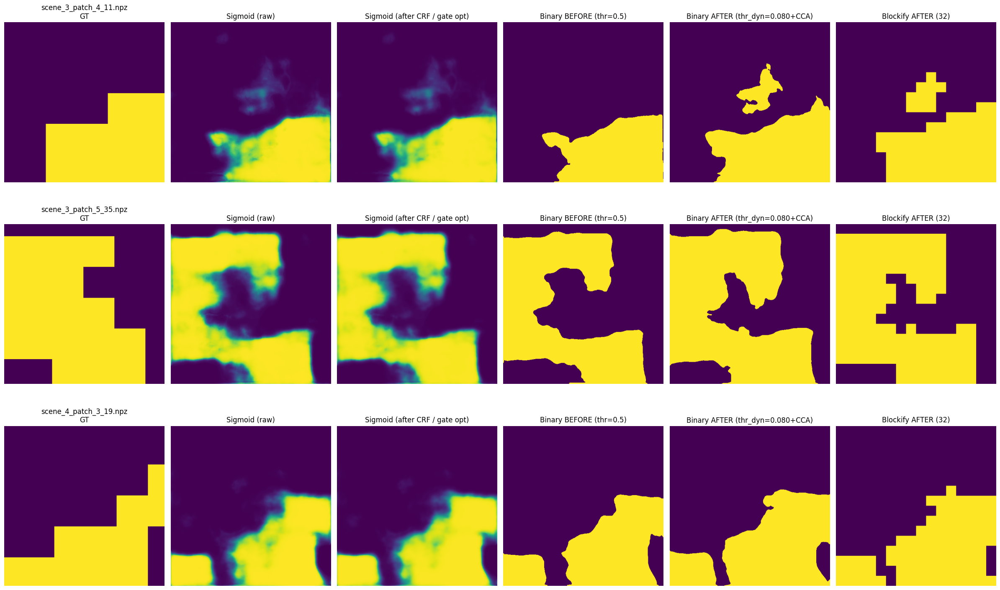

In [21]:
# =========================
# CELL — VISUALISASI P5 (konsisten dengan eval_p5)
# =========================
import os, glob
import numpy as np
import matplotlib.pyplot as plt
import torch
from scipy.ndimage import label as cc_label

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

req = ["df_p5", "models", "cfg", "MEAN_13", "STD_13"]
for k in req:
    if k not in globals():
        raise NameError(f"{k} belum ada. Jalankan cell evaluasi P5 dulu. Missing: {k}")

# pilih best model dari df_p5
best_row = df_p5.sort_values("F1", ascending=False).iloc[0]
BEST_MODEL_NAME = best_row["Model"]
BEST_MODEL = dict(models)[BEST_MODEL_NAME]
print("[OK] Best model:", BEST_MODEL_NAME, "| F1=", float(best_row["F1"]))

# params (samain dengan yang kamu pakai waktu eval)
TEMPERATURE = float(globals().get("TEMPERATURE", 1.0))
BASE        = float(globals().get("BASE", 0.08))
ALPHA_ENT   = float(globals().get("ALPHA_ENTROPY", 0.08))
BETA_CONF   = float(globals().get("BETA_CONF", 0.20))
T_MIN       = float(globals().get("T_MIN", 0.08))
T_MAX       = float(globals().get("T_MAX", 0.95))

USE_NDWI    = bool(globals().get("USE_NDWI", False))
NDWI_THR    = float(globals().get("NDWI_THR", 0.20))
USE_NBR     = bool(globals().get("USE_NBR", False))
NBR_THR     = float(globals().get("NBR_THR", 0.70))

CRF_ITERS   = int(globals().get("CRF_ITERS", 5))
MIN_PIXELS  = int(globals().get("MIN_PIXELS", 32))
CONNECTIVITY= int(globals().get("CONNECTIVITY", 2))

print("[OK] Using params:",
      dict(TEMPERATURE=TEMPERATURE, BASE=BASE, ALPHA_ENTROPY=ALPHA_ENT, BETA_CONF=BETA_CONF,
           T_MIN=T_MIN, T_MAX=T_MAX, USE_NDWI=USE_NDWI, USE_NBR=USE_NBR,
           CRF_ITERS=CRF_ITERS, MIN_PIXELS=MIN_PIXELS))

ROOT = "/kaggle/input/sen2fire/Sen2Fire/Sen2Fire"
PATCH_NAMES = [
    "scene_3_patch_4_11.npz",
    "scene_3_patch_5_35.npz",
    "scene_4_patch_3_19.npz",
]

def find_npz_by_name(root, fname):
    hits = glob.glob(os.path.join(root, "**", fname), recursive=True)
    if len(hits) == 0:
        raise FileNotFoundError(f"Tidak ketemu {fname} di {root}")
    return hits[0]

def load_patch_fixed(npz_path):
    d = np.load(npz_path)
    keys = list(d.keys())

    x_key = "image" if "image" in keys else None
    y_key = "label" if "label" in keys else None
    a_key = "aerosol" if "aerosol" in keys else None

    if x_key is None:
        for k in keys:
            if d[k].ndim == 3:
                x_key = k; break
    if y_key is None:
        for k in keys:
            if k == x_key: 
                continue
            if d[k].ndim in [2,3] and ("label" in k.lower() or "mask" in k.lower() or "gt" in k.lower()):
                y_key = k; break
    if y_key is None:
        for k in keys:
            if k == x_key: 
                continue
            if d[k].ndim in [2,3]:
                y_key = k; break

    x_img = d[x_key].astype(np.float32)  # (12,H,W) biasanya
    y = d[y_key]
    if y.ndim == 3:
        y = y[...,0]
    gt = (y > 0).astype(np.uint8)

    aerosol = None
    if a_key is not None:
        aer = d[a_key]
        if aer.ndim == 3:
            aer = aer[...,0]
        aerosol = aer.astype(np.float32)

    # auto-invert kalau ternyata kebalik (optional safety)
    if float(gt.mean()) > 0.80:
        gt = (1 - gt).astype(np.uint8)

    return x_img, aerosol, gt

def normalize_chw_to_model(x_chw, mean, std, in_ch):
    C,H,W = x_chw.shape
    if C < in_ch:
        pad = np.zeros((in_ch-C, H, W), dtype=np.float32)
        x2 = np.concatenate([x_chw, pad], axis=0)
    elif C > in_ch:
        x2 = x_chw[:in_ch]
    else:
        x2 = x_chw

    mean = np.array(mean, dtype=np.float32)
    std  = np.array(std,  dtype=np.float32)
    if mean.shape[0] < in_ch:
        mean = np.pad(mean, (0, in_ch-mean.shape[0]), constant_values=0.0)
        std  = np.pad(std,  (0, in_ch-std.shape[0]),  constant_values=1.0)
    mean = mean[:in_ch]; std = std[:in_ch]
    x2 = (x2 - mean[:,None,None])/(std[:,None,None] + 1e-6)
    return x2.astype(np.float32)

@torch.no_grad()
def forward_prob_p5(model, x_chw):
    model = model.to(DEVICE).eval()
    in_ch = int(cfg.IN_CHANNELS)
    x_norm = normalize_chw_to_model(x_chw, MEAN_13, STD_13, in_ch)
    xt = torch.from_numpy(x_norm).unsqueeze(0).to(DEVICE)
    logits = model(xt)
    prob = torch.sigmoid(logits / float(TEMPERATURE))[0,0].detach().cpu().numpy().astype(np.float32)
    return prob

def blockify(mask01, block=32, thr=0.5):
    H, W = mask01.shape
    out = np.zeros_like(mask01, dtype=np.uint8)
    for yy in range(0, H, block):
        for xx in range(0, W, block):
            b = mask01[yy:yy+block, xx:xx+block]
            if b.size and (b.mean() >= thr):
                out[yy:yy+block, xx:xx+block] = 1
    return out

# ---- visualize ----
fig, axs = plt.subplots(len(PATCH_NAMES), 6, figsize=(24, 5*len(PATCH_NAMES)))
if len(PATCH_NAMES) == 1:
    axs = np.expand_dims(axs, 0)

for r, fname in enumerate(PATCH_NAMES):
    path = find_npz_by_name(ROOT, fname)
    x_img12, aerosol, gt = load_patch_fixed(path)

    # build input channels consistent dengan cfg.IN_CHANNELS
    x_chw = x_img12
    if int(cfg.IN_CHANNELS) == 13:
        if aerosol is not None:
            x_chw = np.concatenate([x_img12, aerosol[None, ...].astype(np.float32)], axis=0)
        else:
            pad = np.zeros((1, x_img12.shape[1], x_img12.shape[2]), dtype=np.float32)
            x_chw = np.concatenate([x_img12, pad], axis=0)

    # raw probs
    prob_raw = forward_prob_p5(BEST_MODEL, x_chw)

    # optional mask fusion
    prob_g = prob_raw
    if USE_NDWI or USE_NBR:
        gate01 = mask_fusion_gate_from_xraw(
            x_chw, use_ndwi=USE_NDWI, ndwi_thr=NDWI_THR,
            use_nbr=USE_NBR, nbr_thr=NBR_THR
        )
        prob_g = apply_gate_to_probs(prob_g, gate01)

    # CRF
    guide = _make_guidance_rgb_from_xraw(x_chw)
    prob_pp = crf_refine_probs(prob_g, guide, crf_iters=CRF_ITERS)

    # dynamic thr for THIS patch (micro version but for single patch)
    # make tensor shape (1,1,H,W) as in eval
    pt = torch.from_numpy(prob_raw[None,None,...]).to(DEVICE)
    thr_v = dynamic_threshold_from_probs_micro(
        pt, base=BASE, alpha_entropy=ALPHA_ENT, beta_conf=BETA_CONF, t_min=T_MIN, t_max=T_MAX
    )
    thr_i = float(thr_v[0].item())

    bin_before = (prob_pp >= 0.5).astype(np.uint8)
    bin_after  = (prob_pp >= thr_i).astype(np.uint8)
    bin_after  = cca_process(bin_after, min_pixels=MIN_PIXELS, connectivity=CONNECTIVITY)

    blk = blockify(bin_after, block=32, thr=0.5)

    axs[r,0].imshow(gt, vmin=0, vmax=1); axs[r,0].set_title(f"{fname}\nGT"); axs[r,0].axis("off")
    axs[r,1].imshow(prob_raw, vmin=0, vmax=1); axs[r,1].set_title("Sigmoid (raw)"); axs[r,1].axis("off")
    axs[r,2].imshow(prob_pp, vmin=0, vmax=1); axs[r,2].set_title("Sigmoid (after CRF / gate opt)"); axs[r,2].axis("off")
    axs[r,3].imshow(bin_before, vmin=0, vmax=1); axs[r,3].set_title("Binary BEFORE (thr=0.5)"); axs[r,3].axis("off")
    axs[r,4].imshow(bin_after, vmin=0, vmax=1); axs[r,4].set_title(f"Binary AFTER (thr_dyn={thr_i:.3f}+CCA)"); axs[r,4].axis("off")
    axs[r,5].imshow(blk, vmin=0, vmax=1); axs[r,5].set_title("Blockify AFTER (32)"); axs[r,5].axis("off")

plt.tight_layout()
plt.show()

# Pipeline 10 (Static Thresholding + CCA + CRF)

In [13]:
@torch.no_grad()
def eval_p6(model, loader,
            thr=0.05,
            use_ndwi=False, ndwi_thr=0.20,
            use_nbr=False,  nbr_thr=0.70,
            crf_iters=5,
            min_pixels=2852, connectivity=2):

    TP=FP=TN=FN=0.0
    probs_all=[]; labels_all=[]
    valid_pixels=0; total_pixels=0

    model.eval()

    for x, y in loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)

        qm = make_quality_mask(x, y)
        x_norm = normalize_batch(x, MEAN_13, STD_13)
        logits = model(x_norm)
        probs  = torch.sigmoid(logits)

        B = x.shape[0]
        for i in range(B):
            xraw = x[i].detach().cpu().numpy()
            gt   = y[i,0].detach().cpu().numpy()
            q    = qm[i,0].detach().cpu().numpy().astype(bool)

            pr_prob = probs[i,0].detach().cpu().numpy().astype(np.float32)

            gate01 = mask_fusion_gate_from_xraw(xraw, use_ndwi=use_ndwi, ndwi_thr=ndwi_thr, use_nbr=use_nbr, nbr_thr=nbr_thr)
            pr_prob = apply_gate_to_probs(pr_prob, gate01)

            guide = _make_guidance_rgb_from_xraw(xraw)
            pr_prob = crf_refine_probs(pr_prob, guide, crf_iters=crf_iters)

            pr_bin = (pr_prob >= float(thr)).astype(np.uint8)

            pr_bin = cca_process(pr_bin, min_pixels=min_pixels, connectivity=connectivity)

            gt_m = gt[q]; pb_m = pr_bin[q]; pp_m = pr_prob[q]

            valid_pixels += q.sum(); total_pixels += q.size
            TP += float(np.sum((pb_m==1)&(gt_m==1)))
            FP += float(np.sum((pb_m==1)&(gt_m==0)))
            TN += float(np.sum((pb_m==0)&(gt_m==0)))
            FN += float(np.sum((pb_m==0)&(gt_m==1)))

            probs_all.append(pp_m.reshape(-1))
            labels_all.append(gt_m.reshape(-1))

    acc, prec, rec, f1 = _metrics_from_conf(TP,FP,TN,FN)
    pr_auc = float(average_precision_score(np.concatenate(labels_all).astype(np.int32),
                                          np.concatenate(probs_all).astype(np.float64)))
    return dict(Accuracy=acc, Precision=prec, Recall=rec, F1=f1, PR_AUC=pr_auc,
                ValidPixelRatio=float(valid_pixels/(total_pixels+1e-12)))

THR=0.05
USE_NDWI=False; NDWI_THR=0.20; USE_NBR=False; NBR_THR=0.70
CRF_ITERS=5; MIN_PIXELS=2582; CONNECTIVITY=2

models = [
    ("DeepLabV3+ EffNetB4", load_deeplab_effnet(DEEPLAB_PATH)),
    ("UNet ResNet",         load_unet_resnet_autodetect(UNET_RESNET_PATH)),
    ("UNet EffNetB4",       load_unet_effnet(UNET_EFFNET_PATH)),
]

rows=[]
for name, model in models:
    m = eval_p6(model, test_loader,
                thr=THR,
                use_ndwi=USE_NDWI, ndwi_thr=NDWI_THR,
                use_nbr=USE_NBR,  nbr_thr=NBR_THR,
                crf_iters=CRF_ITERS,
                min_pixels=MIN_PIXELS, connectivity=CONNECTIVITY)
    rows.append({"Model":name, "Pipeline":"P10 StaticThr+CCA+CRF",
                 "thr":THR, "CRF_iters":CRF_ITERS, "min_pixels":MIN_PIXELS, **m})

df_p6 = pd.DataFrame(rows)
display(df_p6)

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.
[OK] Loaded DeepLabV3+ EffNetB4
[OK] Loaded UNet resnet18
[OK] Loaded UNet EffNetB4


,Model,Pipeline,thr,CRF_iters,min_pixels,Accuracy,Precision,Recall,F1,PR_AUC,ValidPixelRatio
0,DeepLabV3+ EffNetB4,P10 StaticThr+CCA+CRF,0.05,5,2582,0.982376,0.623451,0.691401,0.655670,0.633650,1.0
1,UNet ResNet,P10 StaticThr+CCA+CRF,0.05,5,2582,0.983891,0.664789,0.678149,0.671403,0.598306,1.0
2,UNet EffNetB4,P10 StaticThr+CCA+CRF,0.05,5,2582,0.989799,0.767556,0.831428,0.798216,0.821538,1.0


[OK] Best model: UNet EffNetB4 | F1= 0.7969059001943112
[OK] Using params: {'THR': 0.05, 'USE_NDWI': False, 'USE_NBR': False, 'NDWI_THR': 0.2, 'NBR_THR': 0.7, 'CRF_ITERS': 5, 'MIN_PIXELS': 2582, 'CONNECTIVITY': 2}


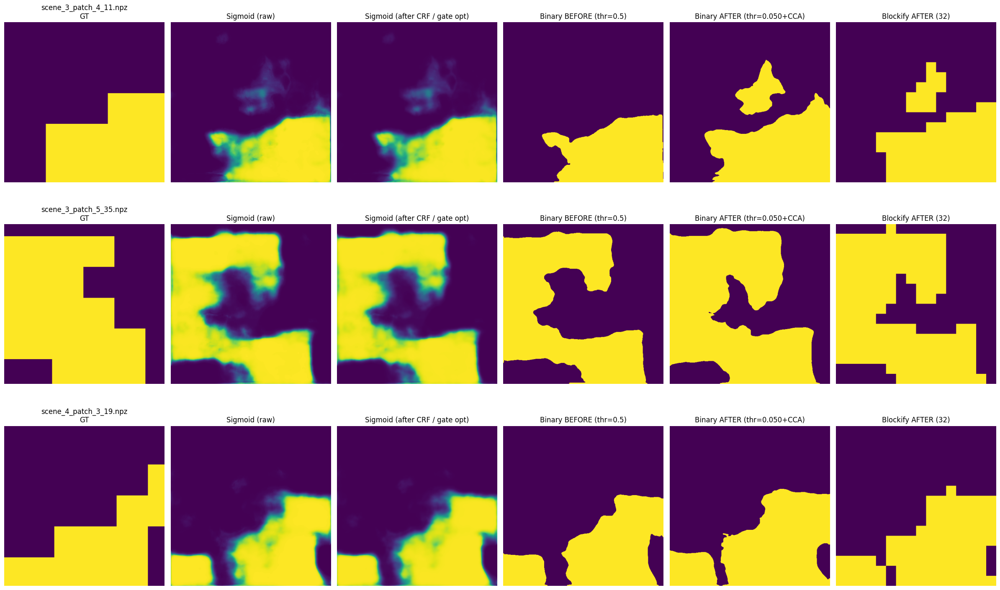

In [23]:
# =========================
# CELL — VISUALISASI P6 (StaticThr + CRF + CCA) + Blockify
# Auto pick BEST model from df_p6
# =========================
import os, glob
import numpy as np
import matplotlib.pyplot as plt
import torch

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

req = ["df_p6", "models", "cfg", "MEAN_13", "STD_13",
       "make_quality_mask", "_make_guidance_rgb_from_xraw",
       "crf_refine_probs", "cca_process",
       "mask_fusion_gate_from_xraw", "apply_gate_to_probs"]
for k in req:
    if k not in globals():
        raise NameError(f"{k} belum ada. Missing: {k}")

# --- best model from df_p6 ---
best_row = df_p6.sort_values("F1", ascending=False).iloc[0]
BEST_MODEL_NAME = best_row["Model"]
BEST_MODEL = dict(models)[BEST_MODEL_NAME]
print("[OK] Best model:", BEST_MODEL_NAME, "| F1=", float(best_row["F1"]))

# --- params (ambil dari globals kalau ada) ---
THR        = float(globals().get("THR", 0.05))
USE_NDWI   = bool(globals().get("USE_NDWI", False))
NDWI_THR   = float(globals().get("NDWI_THR", 0.20))
USE_NBR    = bool(globals().get("USE_NBR", False))
NBR_THR    = float(globals().get("NBR_THR", 0.70))
CRF_ITERS  = int(globals().get("CRF_ITERS", 5))
MIN_PIXELS = int(globals().get("MIN_PIXELS", 128))
CONNECTIVITY = int(globals().get("CONNECTIVITY", 2))

print("[OK] Using params:",
      dict(THR=THR, USE_NDWI=USE_NDWI, USE_NBR=USE_NBR,
           NDWI_THR=NDWI_THR, NBR_THR=NBR_THR,
           CRF_ITERS=CRF_ITERS, MIN_PIXELS=MIN_PIXELS, CONNECTIVITY=CONNECTIVITY))

ROOT = "/kaggle/input/sen2fire/Sen2Fire/Sen2Fire"
PATCH_NAMES = [
    "scene_3_patch_4_11.npz",
    "scene_3_patch_5_35.npz",
    "scene_4_patch_3_19.npz",
]

def find_npz_by_name(root, fname):
    hits = glob.glob(os.path.join(root, "**", fname), recursive=True)
    if len(hits) == 0:
        raise FileNotFoundError(f"Tidak ketemu {fname} di {root}")
    return hits[0]

def load_patch_fixed(npz_path):
    d = np.load(npz_path)
    keys = list(d.keys())

    x_key = "image" if "image" in keys else None
    y_key = "label" if "label" in keys else None
    a_key = "aerosol" if "aerosol" in keys else None

    if x_key is None:
        for k in keys:
            if d[k].ndim == 3:
                x_key = k; break

    if y_key is None:
        for k in keys:
            if k == x_key: 
                continue
            if d[k].ndim in [2,3] and ("label" in k.lower() or "mask" in k.lower() or "gt" in k.lower()):
                y_key = k; break
    if y_key is None:
        for k in keys:
            if k == x_key: 
                continue
            if d[k].ndim in [2,3]:
                y_key = k; break

    x_img12 = d[x_key].astype(np.float32)
    y = d[y_key]
    if y.ndim == 3:
        y = y[...,0]
    gt = (y > 0).astype(np.uint8)

    aerosol = None
    if a_key is not None:
        aer = d[a_key]
        if aer.ndim == 3:
            aer = aer[...,0]
        aerosol = aer.astype(np.float32)

    # safety invert kalau kebalik
    if float(gt.mean()) > 0.80:
        gt = (1 - gt).astype(np.uint8)

    return x_img12, aerosol, gt

def normalize_chw_to_model(x_chw, mean, std, in_ch):
    C,H,W = x_chw.shape
    if C < in_ch:
        pad = np.zeros((in_ch-C, H, W), dtype=np.float32)
        x2 = np.concatenate([x_chw, pad], axis=0)
    elif C > in_ch:
        x2 = x_chw[:in_ch]
    else:
        x2 = x_chw

    mean = np.array(mean, dtype=np.float32)
    std  = np.array(std,  dtype=np.float32)
    if mean.shape[0] < in_ch:
        mean = np.pad(mean, (0, in_ch-mean.shape[0]), constant_values=0.0)
        std  = np.pad(std,  (0, in_ch-std.shape[0]),  constant_values=1.0)
    mean = mean[:in_ch]; std = std[:in_ch]
    x2 = (x2 - mean[:,None,None])/(std[:,None,None] + 1e-6)
    return x2.astype(np.float32)

@torch.no_grad()
def forward_prob_p6(model, x_chw):
    model = model.to(DEVICE).eval()
    in_ch = int(cfg.IN_CHANNELS)
    x_norm = normalize_chw_to_model(x_chw, MEAN_13, STD_13, in_ch)
    xt = torch.from_numpy(x_norm).unsqueeze(0).to(DEVICE)
    logits = model(xt)
    prob = torch.sigmoid(logits)[0,0].detach().cpu().numpy().astype(np.float32)
    return prob

def blockify(mask01, block=32, thr=0.5):
    H, W = mask01.shape
    out = np.zeros_like(mask01, dtype=np.uint8)
    for yy in range(0, H, block):
        for xx in range(0, W, block):
            b = mask01[yy:yy+block, xx:xx+block]
            if b.size and (b.mean() >= thr):
                out[yy:yy+block, xx:xx+block] = 1
    return out

# ---- visualize ----
fig, axs = plt.subplots(len(PATCH_NAMES), 6, figsize=(24, 5*len(PATCH_NAMES)))
if len(PATCH_NAMES) == 1:
    axs = np.expand_dims(axs, 0)

for r, fname in enumerate(PATCH_NAMES):
    path = find_npz_by_name(ROOT, fname)
    x_img12, aerosol, gt = load_patch_fixed(path)

    # build input channels consistent dengan cfg.IN_CHANNELS
    x_chw = x_img12
    if int(cfg.IN_CHANNELS) == 13:
        if aerosol is not None:
            x_chw = np.concatenate([x_img12, aerosol[None, ...].astype(np.float32)], axis=0)
        else:
            pad = np.zeros((1, x_img12.shape[1], x_img12.shape[2]), dtype=np.float32)
            x_chw = np.concatenate([x_img12, pad], axis=0)

    prob_raw = forward_prob_p6(BEST_MODEL, x_chw)

    # optional mask fusion (OFF kalau USE_NDWI=False & USE_NBR=False)
    prob_g = prob_raw
    if USE_NDWI or USE_NBR:
        gate01 = mask_fusion_gate_from_xraw(
            x_chw, use_ndwi=USE_NDWI, ndwi_thr=NDWI_THR,
            use_nbr=USE_NBR, nbr_thr=NBR_THR
        )
        prob_g = apply_gate_to_probs(prob_g, gate01)

    # CRF refine
    guide = _make_guidance_rgb_from_xraw(x_chw)
    prob_pp = crf_refine_probs(prob_g, guide, crf_iters=CRF_ITERS)

    bin_before = (prob_pp >= 0.5).astype(np.uint8)
    bin_after  = (prob_pp >= float(THR)).astype(np.uint8)
    bin_after  = cca_process(bin_after, min_pixels=MIN_PIXELS, connectivity=CONNECTIVITY)

    blk = blockify(bin_after, block=32, thr=0.5)

    axs[r,0].imshow(gt, vmin=0, vmax=1); axs[r,0].set_title(f"{fname}\nGT"); axs[r,0].axis("off")
    axs[r,1].imshow(prob_raw, vmin=0, vmax=1); axs[r,1].set_title("Sigmoid (raw)"); axs[r,1].axis("off")
    axs[r,2].imshow(prob_pp, vmin=0, vmax=1); axs[r,2].set_title("Sigmoid (after CRF / gate opt)"); axs[r,2].axis("off")
    axs[r,3].imshow(bin_before, vmin=0, vmax=1); axs[r,3].set_title("Binary BEFORE (thr=0.5)"); axs[r,3].axis("off")
    axs[r,4].imshow(bin_after, vmin=0, vmax=1); axs[r,4].set_title(f"Binary AFTER (thr={THR:.3f}+CCA)"); axs[r,4].axis("off")
    axs[r,5].imshow(blk, vmin=0, vmax=1); axs[r,5].set_title("Blockify AFTER (32)"); axs[r,5].axis("off")

plt.tight_layout()
plt.show()

# Pipeline 11 (Dynamic Thresholding + Morph + CRF)

In [36]:
@torch.no_grad()
def eval_p7(model, loader,
            temperature=1.0,
            base=0.08, alpha_entropy=0.08, beta_conf=0.20,
            t_min=0.08, t_max=0.95,
            use_ndwi=True, ndwi_thr=0.20,
            use_nbr=True,  nbr_thr=0.70,
            crf_iters=5,
            k_open=1, k_close=5):

    TP=FP=TN=FN=0.0
    probs_all=[]; labels_all=[]
    valid_pixels=0; total_pixels=0
    thr_list=[]

    model.eval()

    for x, y in loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)

        qm = make_quality_mask(x, y)
        x_norm = normalize_batch(x, MEAN_13, STD_13)
        logits = model(x_norm)
        probs  = torch.sigmoid(logits / float(temperature))

        thr_v = dynamic_threshold_from_probs_micro(
            probs, base=base, alpha_entropy=alpha_entropy, beta_conf=beta_conf,
            t_min=t_min, t_max=t_max
        )
        thr_list.append(thr_v.detach().cpu())

        B = x.shape[0]
        for i in range(B):
            xraw = x[i].detach().cpu().numpy()
            gt   = y[i,0].detach().cpu().numpy()
            q    = qm[i,0].detach().cpu().numpy().astype(bool)

            pr_prob = probs[i,0].detach().cpu().numpy().astype(np.float32)

            gate01 = mask_fusion_gate_from_xraw(xraw, use_ndwi=use_ndwi, ndwi_thr=ndwi_thr, use_nbr=use_nbr, nbr_thr=nbr_thr)
            pr_prob = apply_gate_to_probs(pr_prob, gate01)

            guide = _make_guidance_rgb_from_xraw(xraw)
            pr_prob = crf_refine_probs(pr_prob, guide, crf_iters=crf_iters)

            thr_i = float(thr_v[i].item())
            pr_bin = (pr_prob >= thr_i).astype(np.uint8)

            pr_bin = morph_process(pr_bin, k_open=k_open, k_close=k_close, fill=True)

            gt_m = gt[q]; pb_m = pr_bin[q]; pp_m = pr_prob[q]

            valid_pixels += q.sum(); total_pixels += q.size
            TP += float(np.sum((pb_m==1)&(gt_m==1)))
            FP += float(np.sum((pb_m==1)&(gt_m==0)))
            TN += float(np.sum((pb_m==0)&(gt_m==0)))
            FN += float(np.sum((pb_m==0)&(gt_m==1)))

            probs_all.append(pp_m.reshape(-1))
            labels_all.append(gt_m.reshape(-1))

    acc, prec, rec, f1 = _metrics_from_conf(TP,FP,TN,FN)
    pr_auc = float(average_precision_score(np.concatenate(labels_all).astype(np.int32),
                                          np.concatenate(probs_all).astype(np.float64)))
    thr_all = torch.cat(thr_list).numpy()
    return dict(Accuracy=acc, Precision=prec, Recall=rec, F1=f1, PR_AUC=pr_auc,
                Thr_mean=float(thr_all.mean()), Thr_std=float(thr_all.std()),
                ValidPixelRatio=float(valid_pixels/(total_pixels+1e-12)))

TEMPERATURE=1.0; BASE=0.08; ALPHA_ENTROPY=0.08; BETA_CONF=0.20; T_MIN=0.05; T_MAX=0.95
USE_NDWI=False; NDWI_THR=0.20; USE_NBR=False; NBR_THR=0.70
CRF_ITERS=5; K_OPEN=1; K_CLOSE=5

models = [
    ("DeepLabV3+ EffNetB4", load_deeplab_effnet(DEEPLAB_PATH)),
    ("UNet ResNet",         load_unet_resnet_autodetect(UNET_RESNET_PATH)),
    ("UNet EffNetB4",       load_unet_effnet(UNET_EFFNET_PATH)),
]

rows=[]
for name, model in models:
    m = eval_p7(model, test_loader,
                temperature=TEMPERATURE,
                base=BASE, alpha_entropy=ALPHA_ENTROPY, beta_conf=BETA_CONF,
                t_min=T_MIN, t_max=T_MAX,
                use_ndwi=USE_NDWI, ndwi_thr=NDWI_THR,
                use_nbr=USE_NBR,  nbr_thr=NBR_THR,
                crf_iters=CRF_ITERS,
                k_open=K_OPEN, k_close=K_CLOSE)
    rows.append({"Model":name, "Pipeline":"P11 DynamicThr+Morph+CRF",
                 "CRF_iters":CRF_ITERS, "k_open":K_OPEN, "k_close":K_CLOSE, **m})

df_p7 = pd.DataFrame(rows)
display(df_p7)

[OK] Loaded DeepLabV3+ EffNetB4
[OK] Loaded UNet resnet18
[OK] Loaded UNet EffNetB4


,Model,Pipeline,CRF_iters,k_open,k_close,Accuracy,Precision,Recall,F1,PR_AUC,Thr_mean,Thr_std,ValidPixelRatio
0,DeepLabV3+ EffNetB4,P11 DynamicThr+Morph+CRF,5,1,5,0.982508,0.632111,0.668063,0.649590,0.631373,0.08,7.450581e-09,1.0
1,UNet ResNet,P11 DynamicThr+Morph+CRF,5,1,5,0.983305,0.673388,0.606008,0.637924,0.600232,NaN,NaN,1.0
2,UNet EffNetB4,P11 DynamicThr+Morph+CRF,5,1,5,0.989819,0.786149,0.797398,0.791733,0.820811,0.08,7.450581e-09,1.0


[OK] Best model: UNet EffNetB4 | F1= 0.7917333481362518
[OK] Using params: {'TEMPERATURE': 1.0, 'BASE': 0.08, 'ALPHA_ENTROPY': 0.08, 'BETA_CONF': 0.2, 'T_MIN': 0.08, 'T_MAX': 0.95, 'USE_NDWI': False, 'NDWI_THR': 0.2, 'USE_NBR': False, 'NBR_THR': 0.7, 'CRF_ITERS': 5, 'K_OPEN': 1, 'K_CLOSE': 5}


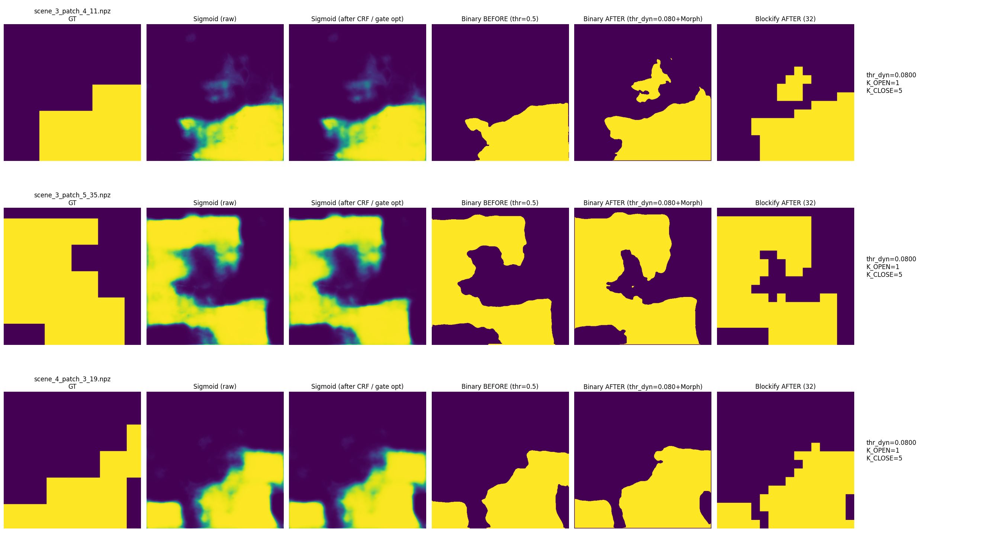

In [25]:
# =========================
# CELL — VISUALISASI P7 (DynamicThr + Morph + CRF) + (MaskFusion optional) + Blockify
# Auto pick BEST model from df_p7
# =========================
import os, glob
import numpy as np
import matplotlib.pyplot as plt
import torch

from scipy.ndimage import binary_opening, binary_closing, binary_fill_holes

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

req = ["df_p7", "models", "cfg", "MEAN_13", "STD_13",
       "make_quality_mask",
       "dynamic_threshold_from_probs_micro",
       "mask_fusion_gate_from_xraw", "apply_gate_to_probs",
       "_make_guidance_rgb_from_xraw", "crf_refine_probs",
       "morph_process"]
for k in req:
    if k not in globals():
        raise NameError(f"{k} belum ada. Missing: {k}")

# --- best model from df_p7 ---
best_row = df_p7.sort_values("F1", ascending=False).iloc[0]
BEST_MODEL_NAME = best_row["Model"]
BEST_MODEL = dict(models)[BEST_MODEL_NAME]
print("[OK] Best model:", BEST_MODEL_NAME, "| F1=", float(best_row["F1"]))

# --- params (ambil dari globals kalau ada) ---
TEMPERATURE   = float(globals().get("TEMPERATURE", 1.0))
BASE          = float(globals().get("BASE", 0.08))
ALPHA_ENTROPY = float(globals().get("ALPHA_ENTROPY", 0.08))
BETA_CONF     = float(globals().get("BETA_CONF", 0.20))
T_MIN         = float(globals().get("T_MIN", 0.08))
T_MAX         = float(globals().get("T_MAX", 0.95))

USE_NDWI = bool(globals().get("USE_NDWI", True))
NDWI_THR = float(globals().get("NDWI_THR", 0.20))
USE_NBR  = bool(globals().get("USE_NBR", True))
NBR_THR  = float(globals().get("NBR_THR", 0.70))

CRF_ITERS = int(globals().get("CRF_ITERS", 5))
K_OPEN    = int(globals().get("K_OPEN", 1))
K_CLOSE   = int(globals().get("K_CLOSE", 5))

print("[OK] Using params:",
      dict(TEMPERATURE=TEMPERATURE, BASE=BASE, ALPHA_ENTROPY=ALPHA_ENTROPY, BETA_CONF=BETA_CONF,
           T_MIN=T_MIN, T_MAX=T_MAX,
           USE_NDWI=USE_NDWI, NDWI_THR=NDWI_THR, USE_NBR=USE_NBR, NBR_THR=NBR_THR,
           CRF_ITERS=CRF_ITERS, K_OPEN=K_OPEN, K_CLOSE=K_CLOSE))

ROOT = "/kaggle/input/sen2fire/Sen2Fire/Sen2Fire"
PATCH_NAMES = [
    "scene_3_patch_4_11.npz",
    "scene_3_patch_5_35.npz",
    "scene_4_patch_3_19.npz",
]

def find_npz_by_name(root, fname):
    hits = glob.glob(os.path.join(root, "**", fname), recursive=True)
    if len(hits) == 0:
        raise FileNotFoundError(f"Tidak ketemu {fname} di {root}")
    return hits[0]

def load_patch_fixed(npz_path):
    d = np.load(npz_path)
    keys = list(d.keys())

    x_key = "image" if "image" in keys else None
    y_key = "label" if "label" in keys else None
    a_key = "aerosol" if "aerosol" in keys else None

    if x_key is None:
        for k in keys:
            if d[k].ndim == 3:
                x_key = k; break

    if y_key is None:
        for k in keys:
            if k == x_key:
                continue
            if d[k].ndim in [2,3] and ("label" in k.lower() or "mask" in k.lower() or "gt" in k.lower()):
                y_key = k; break
    if y_key is None:
        for k in keys:
            if k == x_key:
                continue
            if d[k].ndim in [2,3]:
                y_key = k; break

    x_img12 = d[x_key].astype(np.float32)
    y = d[y_key]
    if y.ndim == 3:
        y = y[...,0]
    gt = (y > 0).astype(np.uint8)

    aerosol = None
    if a_key is not None:
        aer = d[a_key]
        if aer.ndim == 3:
            aer = aer[...,0]
        aerosol = aer.astype(np.float32)

    # safety invert kalau kebalik
    if float(gt.mean()) > 0.80:
        gt = (1 - gt).astype(np.uint8)

    return x_img12, aerosol, gt

def normalize_chw_to_model(x_chw, mean, std, in_ch):
    C,H,W = x_chw.shape
    if C < in_ch:
        pad = np.zeros((in_ch-C, H, W), dtype=np.float32)
        x2 = np.concatenate([x_chw, pad], axis=0)
    elif C > in_ch:
        x2 = x_chw[:in_ch]
    else:
        x2 = x_chw

    mean = np.array(mean, dtype=np.float32)
    std  = np.array(std,  dtype=np.float32)
    if mean.shape[0] < in_ch:
        mean = np.pad(mean, (0, in_ch-mean.shape[0]), constant_values=0.0)
        std  = np.pad(std,  (0, in_ch-std.shape[0]),  constant_values=1.0)
    mean = mean[:in_ch]; std = std[:in_ch]
    x2 = (x2 - mean[:,None,None])/(std[:,None,None] + 1e-6)
    return x2.astype(np.float32)

@torch.no_grad()
def forward_prob_logits_p7(model, x_chw):
    """
    Return prob map + also a single-image dynamic threshold.
    We compute thr from the prob tensor like eval_p7 (micro over pixels).
    """
    model = model.to(DEVICE).eval()
    in_ch = int(cfg.IN_CHANNELS)
    x_norm = normalize_chw_to_model(x_chw, MEAN_13, STD_13, in_ch)
    xt = torch.from_numpy(x_norm).unsqueeze(0).to(DEVICE)

    logits = model(xt)
    probs  = torch.sigmoid(logits / float(TEMPERATURE))  # (1,1,H,W)

    thr_v = dynamic_threshold_from_probs_micro(
        probs,
        base=BASE, alpha_entropy=ALPHA_ENTROPY, beta_conf=BETA_CONF,
        t_min=T_MIN, t_max=T_MAX
    )  # (1,)
    thr_i = float(thr_v[0].item())

    prob = probs[0,0].detach().cpu().numpy().astype(np.float32)
    return prob, thr_i

def blockify(mask01, block=32, thr=0.5):
    H, W = mask01.shape
    out = np.zeros_like(mask01, dtype=np.uint8)
    for yy in range(0, H, block):
        for xx in range(0, W, block):
            b = mask01[yy:yy+block, xx:xx+block]
            if b.size and (b.mean() >= thr):
                out[yy:yy+block, xx:xx+block] = 1
    return out

# ---- visualize ----
fig, axs = plt.subplots(len(PATCH_NAMES), 7, figsize=(27, 5*len(PATCH_NAMES)))
if len(PATCH_NAMES) == 1:
    axs = np.expand_dims(axs, 0)

for r, fname in enumerate(PATCH_NAMES):
    path = find_npz_by_name(ROOT, fname)
    x_img12, aerosol, gt = load_patch_fixed(path)

    # build x_chw consistent dengan cfg.IN_CHANNELS
    x_chw = x_img12
    if int(cfg.IN_CHANNELS) == 13:
        if aerosol is not None:
            x_chw = np.concatenate([x_img12, aerosol[None, ...].astype(np.float32)], axis=0)
        else:
            pad = np.zeros((1, x_img12.shape[1], x_img12.shape[2]), dtype=np.float32)
            x_chw = np.concatenate([x_img12, pad], axis=0)

    prob_raw, thr_i = forward_prob_logits_p7(BEST_MODEL, x_chw)

    # optional mask fusion gate
    prob_g = prob_raw
    if USE_NDWI or USE_NBR:
        gate01 = mask_fusion_gate_from_xraw(
            x_chw,
            use_ndwi=USE_NDWI, ndwi_thr=NDWI_THR,
            use_nbr=USE_NBR,  nbr_thr=NBR_THR
        )
        prob_g = apply_gate_to_probs(prob_g, gate01)

    # CRF refine
    guide = _make_guidance_rgb_from_xraw(x_chw)
    prob_pp = crf_refine_probs(prob_g, guide, crf_iters=CRF_ITERS)

    # BEFORE / AFTER
    bin_before = (prob_pp >= 0.5).astype(np.uint8)
    bin_after  = (prob_pp >= float(thr_i)).astype(np.uint8)
    bin_after  = morph_process(bin_after, k_open=K_OPEN, k_close=K_CLOSE, fill=True)

    blk = blockify(bin_after, block=32, thr=0.5)

    axs[r,0].imshow(gt, vmin=0, vmax=1); axs[r,0].set_title(f"{fname}\nGT"); axs[r,0].axis("off")
    axs[r,1].imshow(prob_raw, vmin=0, vmax=1); axs[r,1].set_title("Sigmoid (raw)"); axs[r,1].axis("off")
    axs[r,2].imshow(prob_pp, vmin=0, vmax=1); axs[r,2].set_title("Sigmoid (after CRF / gate opt)"); axs[r,2].axis("off")
    axs[r,3].imshow(bin_before, vmin=0, vmax=1); axs[r,3].set_title("Binary BEFORE (thr=0.5)"); axs[r,3].axis("off")
    axs[r,4].imshow(bin_after, vmin=0, vmax=1); axs[r,4].set_title(f"Binary AFTER (thr_dyn={thr_i:.3f}+Morph)"); axs[r,4].axis("off")
    axs[r,5].imshow(blk, vmin=0, vmax=1); axs[r,5].set_title("Blockify AFTER (32)"); axs[r,5].axis("off")
    axs[r,6].text(0.05, 0.5, f"thr_dyn={thr_i:.4f}\nK_OPEN={K_OPEN}\nK_CLOSE={K_CLOSE}",
                  fontsize=12)
    axs[r,6].axis("off")

plt.tight_layout()
plt.show()

# Pipeline 12 (Static Thresholding + Morph + CRF)

In [37]:
@torch.no_grad()
def eval_p8(model, loader,
            thr=0.05,
            use_ndwi=False, ndwi_thr=0.20,
            use_nbr=False,  nbr_thr=0.70,
            crf_iters=5,
            k_open=1, k_close=5):

    TP=FP=TN=FN=0.0
    probs_all=[]; labels_all=[]
    valid_pixels=0; total_pixels=0

    model.eval()

    for x, y in loader:
        x = x.to(DEVICE, non_blocking=True)
        y = y.to(DEVICE, non_blocking=True)

        qm = make_quality_mask(x, y)
        x_norm = normalize_batch(x, MEAN_13, STD_13)
        logits = model(x_norm)
        probs  = torch.sigmoid(logits)

        B = x.shape[0]
        for i in range(B):
            xraw = x[i].detach().cpu().numpy()
            gt   = y[i,0].detach().cpu().numpy()
            q    = qm[i,0].detach().cpu().numpy().astype(bool)

            pr_prob = probs[i,0].detach().cpu().numpy().astype(np.float32)

            gate01 = mask_fusion_gate_from_xraw(xraw, use_ndwi=use_ndwi, ndwi_thr=ndwi_thr, use_nbr=use_nbr, nbr_thr=nbr_thr)
            pr_prob = apply_gate_to_probs(pr_prob, gate01)

            guide = _make_guidance_rgb_from_xraw(xraw)
            pr_prob = crf_refine_probs(pr_prob, guide, crf_iters=crf_iters)

            pr_bin = (pr_prob >= float(thr)).astype(np.uint8)

            pr_bin = morph_process(pr_bin, k_open=k_open, k_close=k_close, fill=True)

            gt_m = gt[q]; pb_m = pr_bin[q]; pp_m = pr_prob[q]

            valid_pixels += q.sum(); total_pixels += q.size
            TP += float(np.sum((pb_m==1)&(gt_m==1)))
            FP += float(np.sum((pb_m==1)&(gt_m==0)))
            TN += float(np.sum((pb_m==0)&(gt_m==0)))
            FN += float(np.sum((pb_m==0)&(gt_m==1)))

            probs_all.append(pp_m.reshape(-1))
            labels_all.append(gt_m.reshape(-1))

    acc, prec, rec, f1 = _metrics_from_conf(TP,FP,TN,FN)
    pr_auc = float(average_precision_score(np.concatenate(labels_all).astype(np.int32),
                                          np.concatenate(probs_all).astype(np.float64)))
    return dict(Accuracy=acc, Precision=prec, Recall=rec, F1=f1, PR_AUC=pr_auc,
                ValidPixelRatio=float(valid_pixels/(total_pixels+1e-12)))

THR=0.05
USE_NDWI=False; NDWI_THR=0.20; USE_NBR=False; NBR_THR=0.70
CRF_ITERS=5; K_OPEN=1; K_CLOSE=5

models = [
    ("DeepLabV3+ EffNetB4", load_deeplab_effnet(DEEPLAB_PATH)),
    ("UNet ResNet",         load_unet_resnet_autodetect(UNET_RESNET_PATH)),
    ("UNet EffNetB4",       load_unet_effnet(UNET_EFFNET_PATH)),
]

rows=[]
for name, model in models:
    m = eval_p8(model, test_loader,
                thr=THR,
                use_ndwi=USE_NDWI, ndwi_thr=NDWI_THR,
                use_nbr=USE_NBR,  nbr_thr=NBR_THR,
                crf_iters=CRF_ITERS,
                k_open=K_OPEN, k_close=K_CLOSE)
    rows.append({"Model":name, "Pipeline":"P12 StaticThr+Morph+CRF",
                 "thr":THR, "CRF_iters":CRF_ITERS, "k_open":K_OPEN, "k_close":K_CLOSE, **m})

df_p8 = pd.DataFrame(rows)
display(df_p8)

[OK] Loaded DeepLabV3+ EffNetB4
[OK] Loaded UNet resnet18
[OK] Loaded UNet EffNetB4


,Model,Pipeline,thr,CRF_iters,k_open,k_close,Accuracy,Precision,Recall,F1,PR_AUC,ValidPixelRatio
0,DeepLabV3+ EffNetB4,P12 StaticThr+Morph+CRF,0.05,5,1,5,0.981455,0.601641,0.698059,0.646273,0.631373,1.0
1,UNet ResNet,P12 StaticThr+Morph+CRF,0.05,5,1,5,0.983165,0.645731,0.678646,0.661780,0.600232,1.0
2,UNet EffNetB4,P12 StaticThr+Morph+CRF,0.05,5,1,5,0.989001,0.749439,0.821420,0.783780,0.820811,1.0


[OK] Best model: UNet EffNetB4 | F1= 0.7837799938050287
[OK] Using params: {'THR': 0.05, 'USE_NDWI': False, 'NDWI_THR': 0.2, 'USE_NBR': False, 'NBR_THR': 0.7, 'CRF_ITERS': 5, 'K_OPEN': 1, 'K_CLOSE': 5}


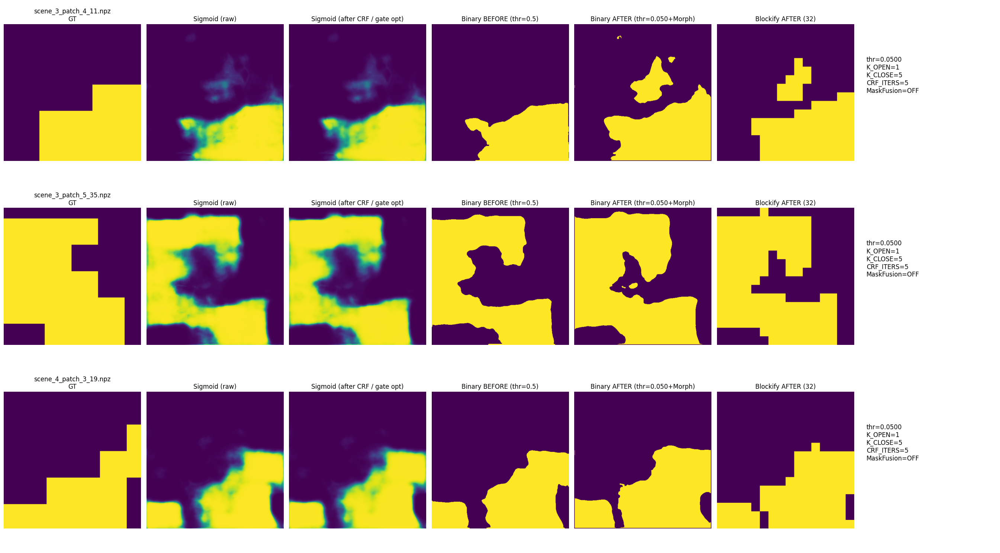

In [27]:
# =========================
# CELL — VISUALISASI P8 (StaticThr + Morph + CRF) + (MaskFusion optional) + Blockify
# Auto pick BEST model from df_p8
# =========================
import os, glob
import numpy as np
import matplotlib.pyplot as plt
import torch

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

req = ["df_p8", "models", "cfg", "MEAN_13", "STD_13",
       "mask_fusion_gate_from_xraw", "apply_gate_to_probs",
       "_make_guidance_rgb_from_xraw", "crf_refine_probs",
       "morph_process"]
for k in req:
    if k not in globals():
        raise NameError(f"{k} belum ada. Missing: {k}")

# --- best model from df_p8 ---
best_row = df_p8.sort_values("F1", ascending=False).iloc[0]
BEST_MODEL_NAME = best_row["Model"]
BEST_MODEL = dict(models)[BEST_MODEL_NAME]
print("[OK] Best model:", BEST_MODEL_NAME, "| F1=", float(best_row["F1"]))

# --- params (ambil dari globals kalau ada) ---
THR       = float(globals().get("THR", 0.05))
USE_NDWI  = bool(globals().get("USE_NDWI", False))
NDWI_THR  = float(globals().get("NDWI_THR", 0.20))
USE_NBR   = bool(globals().get("USE_NBR", False))
NBR_THR   = float(globals().get("NBR_THR", 0.70))
CRF_ITERS = int(globals().get("CRF_ITERS", 5))
K_OPEN    = int(globals().get("K_OPEN", 1))
K_CLOSE   = int(globals().get("K_CLOSE", 5))

print("[OK] Using params:",
      dict(THR=THR, USE_NDWI=USE_NDWI, NDWI_THR=NDWI_THR, USE_NBR=USE_NBR, NBR_THR=NBR_THR,
           CRF_ITERS=CRF_ITERS, K_OPEN=K_OPEN, K_CLOSE=K_CLOSE))

# NOTE: kalau USE_NDWI=False dan USE_NBR=False => gate01 akan all-ones => NO mask fusion effect.

ROOT = "/kaggle/input/sen2fire/Sen2Fire/Sen2Fire"
PATCH_NAMES = [
    "scene_3_patch_4_11.npz",
    "scene_3_patch_5_35.npz",
    "scene_4_patch_3_19.npz",
]

def find_npz_by_name(root, fname):
    hits = glob.glob(os.path.join(root, "**", fname), recursive=True)
    if len(hits) == 0:
        raise FileNotFoundError(f"Tidak ketemu {fname} di {root}")
    return hits[0]

def load_patch_fixed(npz_path):
    d = np.load(npz_path)
    keys = list(d.keys())

    x_key = "image" if "image" in keys else None
    y_key = "label" if "label" in keys else None
    a_key = "aerosol" if "aerosol" in keys else None

    if x_key is None:
        for k in keys:
            if d[k].ndim == 3:
                x_key = k; break

    if y_key is None:
        for k in keys:
            if k == x_key:
                continue
            if d[k].ndim in [2,3] and ("label" in k.lower() or "mask" in k.lower() or "gt" in k.lower()):
                y_key = k; break
    if y_key is None:
        for k in keys:
            if k == x_key:
                continue
            if d[k].ndim in [2,3]:
                y_key = k; break

    x_img12 = d[x_key].astype(np.float32)
    y = d[y_key]
    if y.ndim == 3:
        y = y[...,0]
    gt = (y > 0).astype(np.uint8)

    aerosol = None
    if a_key is not None:
        aer = d[a_key]
        if aer.ndim == 3:
            aer = aer[...,0]
        aerosol = aer.astype(np.float32)

    # safety invert kalau kebalik
    if float(gt.mean()) > 0.80:
        gt = (1 - gt).astype(np.uint8)

    return x_img12, aerosol, gt

def normalize_chw_to_model(x_chw, mean, std, in_ch):
    C,H,W = x_chw.shape
    if C < in_ch:
        pad = np.zeros((in_ch-C, H, W), dtype=np.float32)
        x2 = np.concatenate([x_chw, pad], axis=0)
    elif C > in_ch:
        x2 = x_chw[:in_ch]
    else:
        x2 = x_chw

    mean = np.array(mean, dtype=np.float32)
    std  = np.array(std,  dtype=np.float32)
    if mean.shape[0] < in_ch:
        mean = np.pad(mean, (0, in_ch-mean.shape[0]), constant_values=0.0)
        std  = np.pad(std,  (0, in_ch-std.shape[0]),  constant_values=1.0)
    mean = mean[:in_ch]; std = std[:in_ch]
    x2 = (x2 - mean[:,None,None])/(std[:,None,None] + 1e-6)
    return x2.astype(np.float32)

@torch.no_grad()
def forward_prob_p8(model, x_chw):
    model = model.to(DEVICE).eval()
    in_ch = int(cfg.IN_CHANNELS)
    x_norm = normalize_chw_to_model(x_chw, MEAN_13, STD_13, in_ch)
    xt = torch.from_numpy(x_norm).unsqueeze(0).to(DEVICE)
    logits = model(xt)
    prob = torch.sigmoid(logits)[0,0].detach().cpu().numpy().astype(np.float32)
    return prob

def blockify(mask01, block=32, thr=0.5):
    H, W = mask01.shape
    out = np.zeros_like(mask01, dtype=np.uint8)
    for yy in range(0, H, block):
        for xx in range(0, W, block):
            b = mask01[yy:yy+block, xx:xx+block]
            if b.size and (b.mean() >= thr):
                out[yy:yy+block, xx:xx+block] = 1
    return out

# ---- visualize ----
fig, axs = plt.subplots(len(PATCH_NAMES), 7, figsize=(27, 5*len(PATCH_NAMES)))
if len(PATCH_NAMES) == 1:
    axs = np.expand_dims(axs, 0)

for r, fname in enumerate(PATCH_NAMES):
    path = find_npz_by_name(ROOT, fname)
    x_img12, aerosol, gt = load_patch_fixed(path)

    # build x_chw consistent dengan cfg.IN_CHANNELS
    x_chw = x_img12
    if int(cfg.IN_CHANNELS) == 13:
        if aerosol is not None:
            x_chw = np.concatenate([x_img12, aerosol[None, ...].astype(np.float32)], axis=0)
        else:
            pad = np.zeros((1, x_img12.shape[1], x_img12.shape[2]), dtype=np.float32)
            x_chw = np.concatenate([x_img12, pad], axis=0)

    prob_raw = forward_prob_p8(BEST_MODEL, x_chw)

    # optional mask fusion gate (di case kamu: False/False => no effect)
    prob_g = prob_raw
    if USE_NDWI or USE_NBR:
        gate01 = mask_fusion_gate_from_xraw(
            x_chw,
            use_ndwi=USE_NDWI, ndwi_thr=NDWI_THR,
            use_nbr=USE_NBR,  nbr_thr=NBR_THR
        )
        prob_g = apply_gate_to_probs(prob_g, gate01)

    # CRF refine
    guide = _make_guidance_rgb_from_xraw(x_chw)
    prob_pp = crf_refine_probs(prob_g, guide, crf_iters=CRF_ITERS)

    # BEFORE / AFTER
    bin_before = (prob_pp >= 0.5).astype(np.uint8)
    bin_after  = (prob_pp >= float(THR)).astype(np.uint8)
    bin_after  = morph_process(bin_after, k_open=K_OPEN, k_close=K_CLOSE, fill=True)

    blk = blockify(bin_after, block=32, thr=0.5)

    axs[r,0].imshow(gt, vmin=0, vmax=1); axs[r,0].set_title(f"{fname}\nGT"); axs[r,0].axis("off")
    axs[r,1].imshow(prob_raw, vmin=0, vmax=1); axs[r,1].set_title("Sigmoid (raw)"); axs[r,1].axis("off")
    axs[r,2].imshow(prob_pp, vmin=0, vmax=1); axs[r,2].set_title("Sigmoid (after CRF / gate opt)"); axs[r,2].axis("off")
    axs[r,3].imshow(bin_before, vmin=0, vmax=1); axs[r,3].set_title("Binary BEFORE (thr=0.5)"); axs[r,3].axis("off")
    axs[r,4].imshow(bin_after, vmin=0, vmax=1); axs[r,4].set_title(f"Binary AFTER (thr={THR:.3f}+Morph)"); axs[r,4].axis("off")
    axs[r,5].imshow(blk, vmin=0, vmax=1); axs[r,5].set_title("Blockify AFTER (32)"); axs[r,5].axis("off")
    axs[r,6].text(0.05, 0.5,
                  f"thr={THR:.4f}\nK_OPEN={K_OPEN}\nK_CLOSE={K_CLOSE}\nCRF_ITERS={CRF_ITERS}\nMaskFusion={'ON' if (USE_NDWI or USE_NBR) else 'OFF'}",
                  fontsize=12)
    axs[r,6].axis("off")

plt.tight_layout()
plt.show()

# Print perbandingan dengan postprocessing dan tanpa postprocessing (BELUM DICOBA)

## CCA

[OK] Model: UNet EffNetB4
[OK] Found 17 patches affected by CCA. Showing top 10.


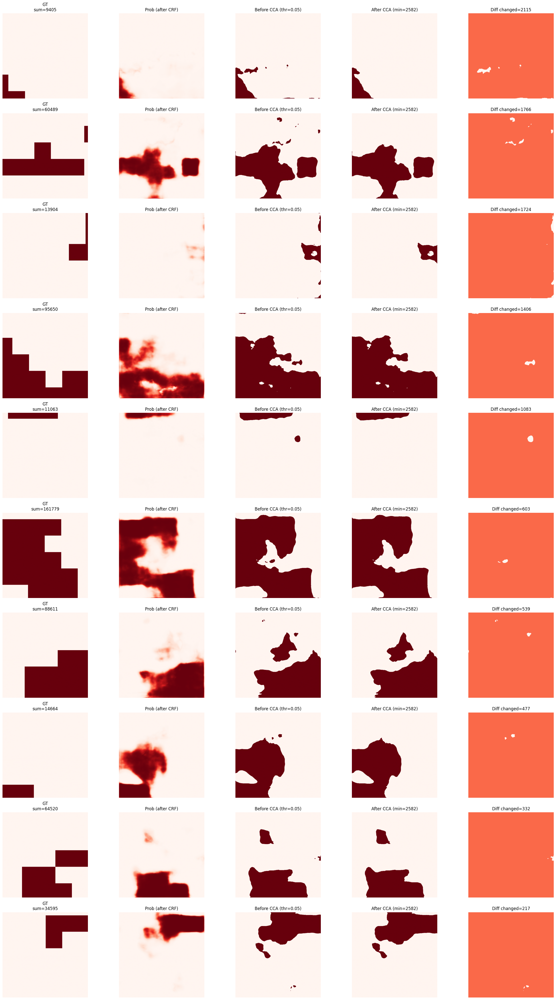

In [39]:
# =========================
# TOP-10 Patch paling terdampak CCA
# Show: GT | Prob(after CRF) | Binary BEFORE CCA | AFTER CCA | Diff
# impact = jumlah pixel yang berubah karena CCA
# =========================
import numpy as np
import matplotlib.pyplot as plt
import torch

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

req = ["test_loader", "models", "MEAN_13", "STD_13",
       "_make_guidance_rgb_from_xraw", "crf_refine_probs",
       "cca_process"]
for k in req:
    if k not in globals():
        raise NameError(f"Missing: {k}")

# pick best model
if "df_p6" in globals():
    best_row = df_p6.sort_values("F1", ascending=False).iloc[0]
    VIS_NAME = best_row["Model"]
    VIS_MODEL = dict(models)[VIS_NAME]
else:
    VIS_NAME, VIS_MODEL = models[2][0], models[2][1]
print("[OK] Model:", VIS_NAME)

CRF_ITERS   = int(globals().get("CRF_ITERS", 5))
THR         = float(globals().get("THR", 0.05))
MIN_PIXELS  = int(globals().get("MIN_PIXELS", 128))
CONNECTIVITY= int(globals().get("CONNECTIVITY", 2))
MIN_GT      = int(globals().get("MIN_GT", 50))
TOPK        = int(globals().get("TOPK", 10))

def normalize_batch_local(x, mean_13, std_13):
    mean = torch.tensor(mean_13, device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    std  = torch.tensor(std_13,  device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    Cx = x.shape[1]; Cm = mean.shape[1]
    if Cx < Cm:
        mean = mean[:, :Cx]; std = std[:, :Cx]
    elif Cx > Cm:
        pad = Cx - Cm
        mean = torch.cat([mean, torch.zeros((1,pad,1,1), device=x.device, dtype=x.dtype)], dim=1)
        std  = torch.cat([std,  torch.ones((1,pad,1,1), device=x.device, dtype=x.dtype)], dim=1)
    return (x - mean) / (std + 1e-6)

@torch.no_grad()
def forward_probs_batch(model, xb):
    model = model.to(DEVICE).eval()
    xb = xb.to(DEVICE, non_blocking=True)
    x_norm = normalize_batch_local(xb, MEAN_13, STD_13)
    logits = model(x_norm)
    probs  = torch.sigmoid(logits)[:,0]  # (B,H,W)
    return probs.detach().cpu().numpy()

# ---- scan all test patches, compute CCA impact ----
cands = []  # (impact, gt_sum, prob_after_crf, gt, beforeCCA, afterCCA)

for x, y in test_loader:
    probs_b = forward_probs_batch(VIS_MODEL, x)  # (B,H,W)
    xb = x.detach().cpu().numpy()
    yb = y[:,0].detach().cpu().numpy().astype(np.uint8)

    B = probs_b.shape[0]
    for i in range(B):
        gt = (yb[i] > 0).astype(np.uint8)
        if gt.sum() < MIN_GT:
            continue

        prob = probs_b[i].astype(np.float32)

        # CRF first (biar konsisten sama pipeline kamu)
        guide = _make_guidance_rgb_from_xraw(xb[i])
        prob_crf = crf_refine_probs(prob, guide, crf_iters=CRF_ITERS)

        before = (prob_crf >= THR).astype(np.uint8)
        after  = cca_process(before, min_pixels=MIN_PIXELS, connectivity=CONNECTIVITY)

        impact = int(np.abs(before.astype(np.int32) - after.astype(np.int32)).sum())
        if impact == 0:
            continue

        cands.append((impact, int(gt.sum()), prob_crf, gt, before, after))

cands.sort(key=lambda t: t[0], reverse=True)
top = cands[:TOPK]

print(f"[OK] Found {len(cands)} patches affected by CCA. Showing top {len(top)}.")
if len(top) == 0:
    raise RuntimeError("Tidak ada patch yang berubah oleh CCA. Coba kecilkan MIN_PIXELS atau turunkan THR.")

# ---- visualize ----
rows = len(top)
fig, axs = plt.subplots(rows, 5, figsize=(24, 4*rows))
if rows == 1:
    axs = np.expand_dims(axs, 0)

for r, (impact, gtsum, prob_crf, gt, before, after) in enumerate(top):
    diff = (after.astype(np.int32) - before.astype(np.int32))  # +1 added, -1 removed

    axs[r,0].imshow(gt, vmin=0, vmax=1,cmap="Reds"); axs[r,0].set_title(f"GT\nsum={gtsum}"); axs[r,0].axis("off")
    axs[r,1].imshow(prob_crf, vmin=0, vmax=1,cmap="Reds"); axs[r,1].set_title("Prob (after CRF)"); axs[r,1].axis("off")
    axs[r,2].imshow(before, vmin=0, vmax=1,cmap="Reds"); axs[r,2].set_title(f"Before CCA (thr={THR:.2f})"); axs[r,2].axis("off")
    axs[r,3].imshow(after, vmin=0, vmax=1,cmap="Reds"); axs[r,3].set_title(f"After CCA (min={MIN_PIXELS})"); axs[r,3].axis("off")
    axs[r,4].imshow(diff, vmin=-1, vmax=1,cmap="Reds"); axs[r,4].set_title(f"Diff changed={impact}"); axs[r,4].axis("off")

plt.tight_layout()
plt.show()

## Thresholding

[OK] Model: UNet EffNetB4
[OK] Found 30 patches affected by threshold change. Showing top 10.


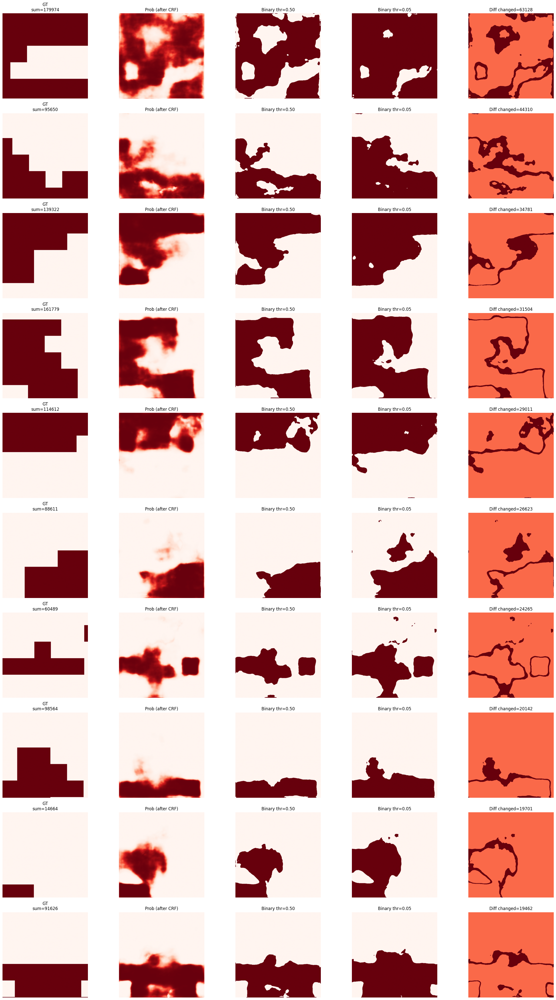

In [40]:
# =========================
# TOP-10 Patch paling terdampak Thresholding
# Show: GT | Prob(after CRF) | thr=0.50 | thr=0.05 | Diff
# impact = jumlah pixel yang berubah karena ganti threshold
# =========================
import numpy as np
import matplotlib.pyplot as plt
import torch

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

req = ["test_loader", "models", "MEAN_13", "STD_13",
       "_make_guidance_rgb_from_xraw", "crf_refine_probs"]
for k in req:
    if k not in globals():
        raise NameError(f"Missing: {k}")

# pick best model
if "df_p8" in globals():
    best_row = df_p8.sort_values("F1", ascending=False).iloc[0]
    VIS_NAME = best_row["Model"]
    VIS_MODEL = dict(models)[VIS_NAME]
else:
    VIS_NAME, VIS_MODEL = models[2][0], models[2][1]
print("[OK] Model:", VIS_NAME)

CRF_ITERS = int(globals().get("CRF_ITERS", 5))
THR_A = float(globals().get("THR_A", 0.50))
THR_B = float(globals().get("THR_B", 0.05))
MIN_GT = int(globals().get("MIN_GT", 50))   # biar bukan patch kosong doang
TOPK  = int(globals().get("TOPK", 10))

def normalize_batch_local(x, mean_13, std_13):
    mean = torch.tensor(mean_13, device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    std  = torch.tensor(std_13,  device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    Cx = x.shape[1]; Cm = mean.shape[1]
    if Cx < Cm:
        mean = mean[:, :Cx]; std = std[:, :Cx]
    elif Cx > Cm:
        pad = Cx - Cm
        mean = torch.cat([mean, torch.zeros((1,pad,1,1), device=x.device, dtype=x.dtype)], dim=1)
        std  = torch.cat([std,  torch.ones((1,pad,1,1), device=x.device, dtype=x.dtype)], dim=1)
    return (x - mean) / (std + 1e-6)

@torch.no_grad()
def forward_probs_batch(model, xb):
    model = model.to(DEVICE).eval()
    xb = xb.to(DEVICE, non_blocking=True)
    x_norm = normalize_batch_local(xb, MEAN_13, STD_13)
    logits = model(x_norm)
    probs  = torch.sigmoid(logits)[:,0]  # (B,H,W)
    return probs.detach().cpu().numpy()

# ---- scan all test patches, compute threshold impact ----
cands = []  # (impact, gt_sum, prob_after_crf, gt, binA, binB)

VIS_MODEL.eval()
for x, y in test_loader:
    probs_b = forward_probs_batch(VIS_MODEL, x)  # (B,H,W)
    xb = x.detach().cpu().numpy()
    yb = y[:,0].detach().cpu().numpy().astype(np.uint8)

    B = probs_b.shape[0]
    for i in range(B):
        gt = (yb[i] > 0).astype(np.uint8)
        if gt.sum() < MIN_GT:
            continue

        prob = probs_b[i].astype(np.float32)

        # CRF
        guide = _make_guidance_rgb_from_xraw(xb[i])
        prob_crf = crf_refine_probs(prob, guide, crf_iters=CRF_ITERS)

        bin_a = (prob_crf >= THR_A).astype(np.uint8)
        bin_b = (prob_crf >= THR_B).astype(np.uint8)

        impact = int(np.abs(bin_a.astype(np.int32) - bin_b.astype(np.int32)).sum())
        if impact == 0:
            continue

        cands.append((impact, int(gt.sum()), prob_crf, gt, bin_a, bin_b))

cands.sort(key=lambda t: t[0], reverse=True)
top = cands[:TOPK]

print(f"[OK] Found {len(cands)} patches affected by threshold change. Showing top {len(top)}.")
if len(top) == 0:
    raise RuntimeError("Tidak ada patch yang berubah oleh thresholding (aneh). Coba ganti THR_A/THR_B.")

# ---- visualize top 10 ----
rows = len(top)
fig, axs = plt.subplots(rows, 5, figsize=(24, 4*rows))
if rows == 1:
    axs = np.expand_dims(axs, 0)

for r, (impact, gtsum, prob_crf, gt, bin_a, bin_b) in enumerate(top):
    diff = (bin_b.astype(np.int32) - bin_a.astype(np.int32))  # +1 added at low thr, -1 removed

    axs[r,0].imshow(gt, vmin=0, vmax=1,cmap="Reds"); axs[r,0].set_title(f"GT\nsum={gtsum}"); axs[r,0].axis("off")
    axs[r,1].imshow(prob_crf, vmin=0, vmax=1,cmap="Reds"); axs[r,1].set_title("Prob (after CRF)"); axs[r,1].axis("off")
    axs[r,2].imshow(bin_a, vmin=0, vmax=1,cmap="Reds"); axs[r,2].set_title(f"Binary thr={THR_A:.2f}"); axs[r,2].axis("off")
    axs[r,3].imshow(bin_b, vmin=0, vmax=1,cmap="Reds"); axs[r,3].set_title(f"Binary thr={THR_B:.2f}"); axs[r,3].axis("off")
    axs[r,4].imshow(diff, vmin=-1, vmax=1,cmap="Reds"); axs[r,4].set_title(f"Diff changed={impact}"); axs[r,4].axis("off")

plt.tight_layout()
plt.show()

## Morphology

[OK] Model: UNet EffNetB4


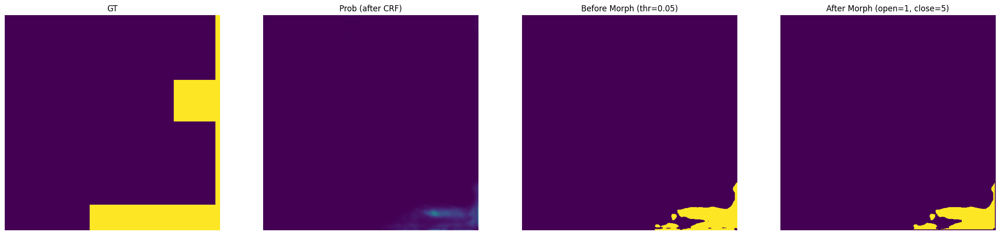

[INFO] Pixel sum before: 7609 | after: 7180


In [31]:
# =========================
# CELL D — Morphological effect
# GT vs Before Morph vs After Morph
# =========================
import numpy as np
import matplotlib.pyplot as plt
import torch

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

req = ["test_loader", "models", "cfg", "MEAN_13", "STD_13",
       "_make_guidance_rgb_from_xraw", "crf_refine_probs", "morph_process"]
for k in req:
    if k not in globals():
        raise NameError(f"Missing: {k}")

# pick best model
if "df_p8" in globals():
    best_row = df_p8.sort_values("F1", ascending=False).iloc[0]
    VIS_NAME = best_row["Model"]
    VIS_MODEL = dict(models)[VIS_NAME]
else:
    VIS_NAME, VIS_MODEL = models[2][0], models[2][1]
print("[OK] Model:", VIS_NAME)

CRF_ITERS = int(globals().get("CRF_ITERS", 5))
THR = float(globals().get("THR", 0.05))
K_OPEN  = int(globals().get("K_OPEN", 1))
K_CLOSE = int(globals().get("K_CLOSE", 5))

def normalize_batch_local(x, mean_13, std_13):
    mean = torch.tensor(mean_13, device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    std  = torch.tensor(std_13,  device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    Cx = x.shape[1]; Cm = mean.shape[1]
    if Cx < Cm:
        mean = mean[:, :Cx]; std = std[:, :Cx]
    elif Cx > Cm:
        pad = Cx - Cm
        mean = torch.cat([mean, torch.zeros((1,pad,1,1), device=x.device, dtype=x.dtype)], dim=1)
        std  = torch.cat([std,  torch.ones((1,pad,1,1), device=x.device, dtype=x.dtype)], dim=1)
    return (x - mean) / (std + 1e-6)

@torch.no_grad()
def forward_prob(model, x_chw):
    model = model.to(DEVICE).eval()
    xt = torch.from_numpy(x_chw).unsqueeze(0).to(DEVICE)
    x_norm = normalize_batch_local(xt, MEAN_13, STD_13)
    logits = model(x_norm)
    return torch.sigmoid(logits)[0,0].detach().cpu().numpy().astype(np.float32)

# pick a fire patch that usually has pepper noise (try many until components>1)
chosen = None
for x, y in test_loader:
    xb = x.detach().cpu().numpy()
    yb = y[:,0].detach().cpu().numpy().astype(np.uint8)
    for i in range(xb.shape[0]):
        gt = (yb[i] > 0).astype(np.uint8)
        if gt.sum() < 200:
            continue
        prob = forward_prob(VIS_MODEL, xb[i])
        guide = _make_guidance_rgb_from_xraw(xb[i])
        prob = crf_refine_probs(prob, guide, crf_iters=CRF_ITERS)
        bin0 = (prob >= THR).astype(np.uint8)
        # cari yang sebelum morph "agak berantakan"
        if bin0.sum() > 100 and bin0.sum() < 200000:
            chosen = (xb[i], gt, prob)
            break
    if chosen is not None:
        break

assert chosen is not None, "Tidak ketemu patch yang cocok. Coba longgarkan syarat."

x_chw, gt, prob = chosen

before_morph = (prob >= THR).astype(np.uint8)
after_morph  = morph_process(before_morph, k_open=K_OPEN, k_close=K_CLOSE, fill=True)

fig, axs = plt.subplots(1, 4, figsize=(22,5))
axs[0].imshow(gt, vmin=0, vmax=1); axs[0].set_title("GT"); axs[0].axis("off")
axs[1].imshow(prob, vmin=0, vmax=1); axs[1].set_title("Prob (after CRF)"); axs[1].axis("off")
axs[2].imshow(before_morph, vmin=0, vmax=1); axs[2].set_title(f"Before Morph (thr={THR})"); axs[2].axis("off")
axs[3].imshow(after_morph, vmin=0, vmax=1); axs[3].set_title(f"After Morph (open={K_OPEN}, close={K_CLOSE})"); axs[3].axis("off")
plt.tight_layout()
plt.show()

print("[INFO] Pixel sum before:", int(before_morph.sum()), "| after:", int(after_morph.sum()))

[OK] Model: UNet EffNetB4
[OK] Found 30 patches affected by morph. Showing top 10.


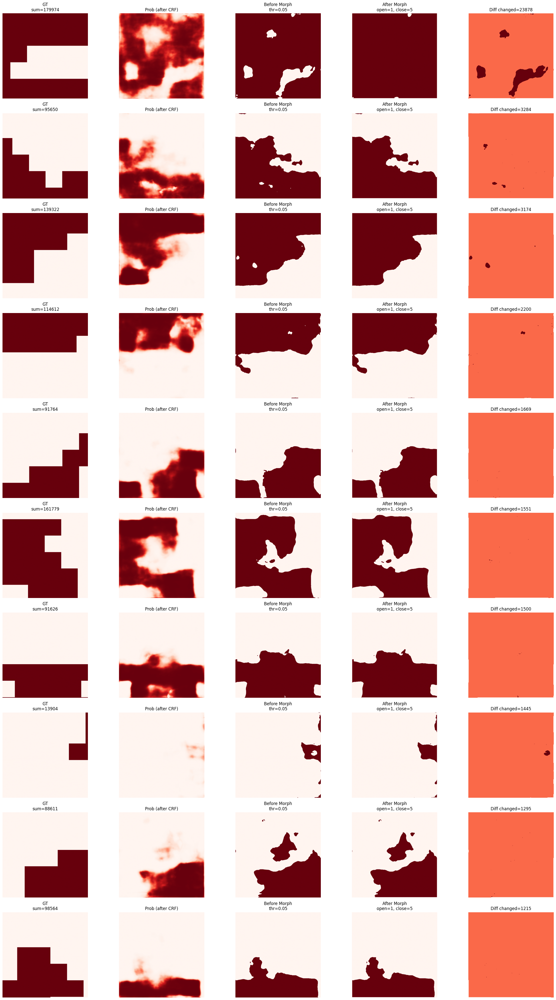

In [42]:
# =========================
# TOP-10 Patch paling terdampak Morphology
# Show: GT | Prob(after CRF) | Before Morph | After Morph | Diff
# =========================
import numpy as np
import matplotlib.pyplot as plt
import torch

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

req = ["test_loader", "models", "MEAN_13", "STD_13",
       "_make_guidance_rgb_from_xraw", "crf_refine_probs", "morph_process"]
for k in req:
    if k not in globals():
        raise NameError(f"Missing: {k}")

# pick best model (optional)
if "df_p8" in globals():
    best_row = df_p8.sort_values("F1", ascending=False).iloc[0]
    VIS_NAME = best_row["Model"]
    VIS_MODEL = dict(models)[VIS_NAME]
else:
    VIS_NAME, VIS_MODEL = models[2][0], models[2][1]
print("[OK] Model:", VIS_NAME)

# params (fallback if not defined)
THR       = float(globals().get("THR", 0.05))
CRF_ITERS = int(globals().get("CRF_ITERS", 5))
K_OPEN    = int(globals().get("K_OPEN", 1))
K_CLOSE   = int(globals().get("K_CLOSE", 5))

# normalize batch safe
def normalize_batch_local(x, mean_13, std_13):
    mean = torch.tensor(mean_13, device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    std  = torch.tensor(std_13,  device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    Cx = x.shape[1]; Cm = mean.shape[1]
    if Cx < Cm:
        mean = mean[:, :Cx]; std = std[:, :Cx]
    elif Cx > Cm:
        pad = Cx - Cm
        mean = torch.cat([mean, torch.zeros((1,pad,1,1), device=x.device, dtype=x.dtype)], dim=1)
        std  = torch.cat([std,  torch.ones((1,pad,1,1), device=x.device, dtype=x.dtype)], dim=1)
    return (x - mean) / (std + 1e-6)

@torch.no_grad()
def forward_probs_batch(model, xb):
    model = model.to(DEVICE).eval()
    xb = xb.to(DEVICE, non_blocking=True)
    x_norm = normalize_batch_local(xb, MEAN_13, STD_13)
    logits = model(x_norm)
    probs  = torch.sigmoid(logits)[:,0]  # (B,H,W)
    return probs.detach().cpu().numpy()

# ---- scan all test patches, compute morph impact ----
topK = 10
cands = []  # each: (impact, gt_sum, prob_after_crf, gt, before, after)

VIS_MODEL.eval()
for x, y in test_loader:
    probs_b = forward_probs_batch(VIS_MODEL, x)  # (B,H,W)
    xb = x.detach().cpu().numpy()
    yb = y[:,0].detach().cpu().numpy().astype(np.uint8)

    B = probs_b.shape[0]
    for i in range(B):
        gt = (yb[i] > 0).astype(np.uint8)
        # skip totally empty GT if you want more meaningful examples
        if gt.sum() < 50:
            continue

        prob = probs_b[i].astype(np.float32)

        # CRF
        guide = _make_guidance_rgb_from_xraw(xb[i])
        prob_crf = crf_refine_probs(prob, guide, crf_iters=CRF_ITERS)

        before = (prob_crf >= THR).astype(np.uint8)
        after  = morph_process(before, k_open=K_OPEN, k_close=K_CLOSE, fill=True)

        # impact = number of pixels that changed state (0->1 or 1->0)
        impact = int(np.abs(after.astype(np.int32) - before.astype(np.int32)).sum())

        # skip if morph does nothing (optional)
        if impact == 0:
            continue

        cands.append((impact, int(gt.sum()), prob_crf, gt, before, after))

# sort & take top 10
cands.sort(key=lambda t: t[0], reverse=True)
top = cands[:topK]

print(f"[OK] Found {len(cands)} patches affected by morph. Showing top {len(top)}.")
if len(top) == 0:
    raise RuntimeError("Tidak ada patch yang berubah oleh morph. Coba ubah K_OPEN/K_CLOSE atau THR.")

# ---- visualize top 10 ----
rows = len(top)
fig, axs = plt.subplots(rows, 5, figsize=(24, 4*rows))
if rows == 1:
    axs = np.expand_dims(axs, 0)

for r, (impact, gtsum, prob_crf, gt, before, after) in enumerate(top):
    diff = (after.astype(np.int32) - before.astype(np.int32))  # -1 removed, +1 added

    axs[r,0].imshow(gt, vmin=0, vmax=1,cmap="Reds"); axs[r,0].set_title(f"GT\nsum={gtsum}"); axs[r,0].axis("off")
    axs[r,1].imshow(prob_crf, vmin=0, vmax=1,cmap="Reds"); axs[r,1].set_title("Prob (after CRF)"); axs[r,1].axis("off")
    axs[r,2].imshow(before, vmin=0, vmax=1,cmap="Reds"); axs[r,2].set_title(f"Before Morph\nthr={THR}"); axs[r,2].axis("off")
    axs[r,3].imshow(after, vmin=0, vmax=1,cmap="Reds"); axs[r,3].set_title(f"After Morph\nopen={K_OPEN}, close={K_CLOSE}"); axs[r,3].axis("off")

    # diff visualization (blue removed, yellow added) -> matplotlib default colormap: use centered scaling
    axs[r,4].imshow(diff, vmin=-1, vmax=1,cmap="Reds"); axs[r,4].set_title(f"Diff changed={impact}"); axs[r,4].axis("off")

plt.tight_layout()
plt.show()

## CRF

[OK] Model: UNet EffNetB4


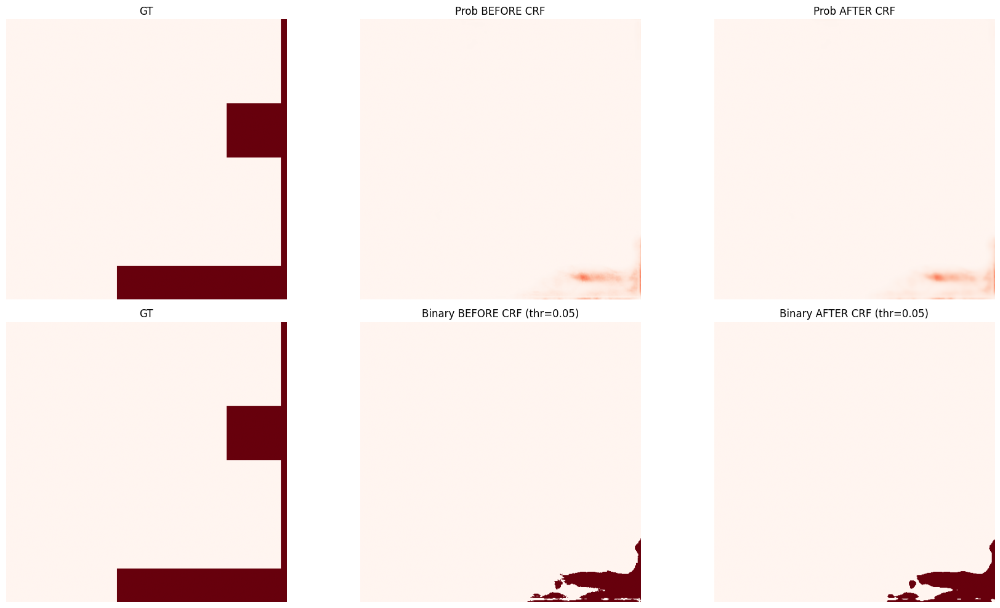

[INFO] mean(|after-before|) = 0.00043472147081047297


In [43]:
# =========================
# CELL C — CRF effect
# GT vs prob(before CRF) vs prob(after CRF) + bin(after thr)
# =========================
import numpy as np
import matplotlib.pyplot as plt
import torch

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

req = ["test_loader", "models", "cfg", "MEAN_13", "STD_13",
       "_make_guidance_rgb_from_xraw", "crf_refine_probs"]
for k in req:
    if k not in globals():
        raise NameError(f"Missing: {k}")

# pick best model
if "df_p8" in globals():
    best_row = df_p8.sort_values("F1", ascending=False).iloc[0]
    VIS_NAME = best_row["Model"]
    VIS_MODEL = dict(models)[VIS_NAME]
else:
    VIS_NAME, VIS_MODEL = models[2][0], models[2][1]
print("[OK] Model:", VIS_NAME)

CRF_ITERS = int(globals().get("CRF_ITERS", 5))
THR = float(globals().get("THR", 0.05))

def normalize_batch_local(x, mean_13, std_13):
    mean = torch.tensor(mean_13, device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    std  = torch.tensor(std_13,  device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    Cx = x.shape[1]; Cm = mean.shape[1]
    if Cx < Cm:
        mean = mean[:, :Cx]; std = std[:, :Cx]
    elif Cx > Cm:
        pad = Cx - Cm
        mean = torch.cat([mean, torch.zeros((1,pad,1,1), device=x.device, dtype=x.dtype)], dim=1)
        std  = torch.cat([std,  torch.ones((1,pad,1,1), device=x.device, dtype=x.dtype)], dim=1)
    return (x - mean) / (std + 1e-6)

@torch.no_grad()
def forward_prob(model, x_chw):
    model = model.to(DEVICE).eval()
    xt = torch.from_numpy(x_chw).unsqueeze(0).to(DEVICE)
    x_norm = normalize_batch_local(xt, MEAN_13, STD_13)
    logits = model(x_norm)
    prob = torch.sigmoid(logits)[0,0].detach().cpu().numpy().astype(np.float32)
    return prob

# pick a fire patch
chosen = None
for x, y in test_loader:
    xb = x.detach().cpu().numpy()
    yb = y[:,0].detach().cpu().numpy().astype(np.uint8)
    for i in range(xb.shape[0]):
        gt = (yb[i] > 0).astype(np.uint8)
        if gt.sum() > 200:
            chosen = (xb[i], gt)
            break
    if chosen is not None:
        break
assert chosen is not None, "Tidak ketemu patch fire besar."

x_chw, gt = chosen

prob_before = forward_prob(VIS_MODEL, x_chw)
guide = _make_guidance_rgb_from_xraw(x_chw)
prob_after  = crf_refine_probs(prob_before, guide, crf_iters=CRF_ITERS)

bin_before = (prob_before >= THR).astype(np.uint8)
bin_after  = (prob_after  >= THR).astype(np.uint8)

fig, axs = plt.subplots(2, 3, figsize=(18,10))
axs[0,0].imshow(gt, vmin=0, vmax=1,cmap="Reds"); axs[0,0].set_title("GT"); axs[0,0].axis("off")
axs[0,1].imshow(prob_before, vmin=0, vmax=1,cmap="Reds"); axs[0,1].set_title("Prob BEFORE CRF"); axs[0,1].axis("off")
axs[0,2].imshow(prob_after, vmin=0, vmax=1,cmap="Reds"); axs[0,2].set_title("Prob AFTER CRF"); axs[0,2].axis("off")

axs[1,0].imshow(gt, vmin=0, vmax=1,cmap="Reds"); axs[1,0].set_title("GT"); axs[1,0].axis("off")
axs[1,1].imshow(bin_before, vmin=0, vmax=1,cmap="Reds"); axs[1,1].set_title(f"Binary BEFORE CRF (thr={THR})"); axs[1,1].axis("off")
axs[1,2].imshow(bin_after, vmin=0, vmax=1,cmap="Reds"); axs[1,2].set_title(f"Binary AFTER CRF (thr={THR})"); axs[1,2].axis("off")
plt.tight_layout()
plt.show()

# optional: lihat perbedaan numerik sederhana
print("[INFO] mean(|after-before|) =", float(np.mean(np.abs(prob_after - prob_before))))

[OK] Model: UNet EffNetB4
[OK] Found 31 CRF-affected patches. Showing top 10.


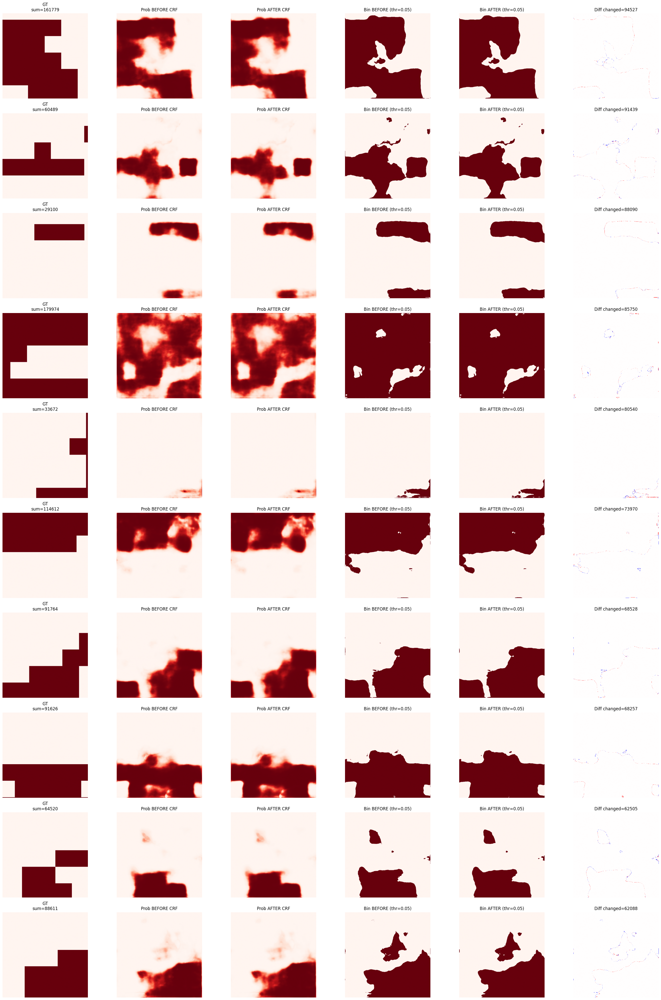

In [14]:
# =========================
# TOP-10 Patch paling terdampak CRF (ONLY CRF)
# Show: GT | Prob(before CRF) | Prob(after CRF)
#       | Bin(before CRF) | Bin(after CRF) | Diff
# impact = jumlah pixel berubah karena CRF
# =========================
import numpy as np
import matplotlib.pyplot as plt
import torch

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

req = ["test_loader", "models", "MEAN_13", "STD_13",
       "_make_guidance_rgb_from_xraw", "crf_refine_probs"]

for k in req:
    if k not in globals():
        raise NameError(f"Missing: {k}")

# ===== Pick best model =====
if "df_p8" in globals():
    best_row = df_p8.sort_values("F1", ascending=False).iloc[0]
    VIS_NAME = best_row["Model"]
    VIS_MODEL = dict(models)[VIS_NAME]
elif "df_p6" in globals():
    best_row = df_p6.sort_values("F1", ascending=False).iloc[0]
    VIS_NAME = best_row["Model"]
    VIS_MODEL = dict(models)[VIS_NAME]
else:
    VIS_NAME, VIS_MODEL = models[2][0], models[2][1]

print("[OK] Model:", VIS_NAME)

CRF_ITERS = 5
THR       = 0.05      # threshold tetap untuk banding BEFORE vs AFTER
MIN_GT    = 50        # hindari patch kosong
TOPK      = 10

def normalize_batch_local(x, mean_13, std_13):
    mean = torch.tensor(mean_13, device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    std  = torch.tensor(std_13,  device=x.device, dtype=x.dtype).view(1, -1, 1, 1)
    return (x - mean) / (std + 1e-6)

@torch.no_grad()
def forward_probs_batch(model, xb):
    model = model.to(DEVICE).eval()
    xb = xb.to(DEVICE)
    x_norm = normalize_batch_local(xb, MEAN_13, STD_13)
    logits = model(x_norm)
    probs  = torch.sigmoid(logits)[:,0]
    return probs.detach().cpu().numpy()

# =========================
# Scan semua patch
# =========================
cands = []

for x, y in test_loader:

    probs_before = forward_probs_batch(VIS_MODEL, x)
    xb = x.detach().cpu().numpy()
    yb = y[:,0].detach().cpu().numpy().astype(np.uint8)

    B = probs_before.shape[0]

    for i in range(B):

        gt = (yb[i] > 0).astype(np.uint8)
        if gt.sum() < MIN_GT:
            continue

        prob_before = probs_before[i].astype(np.float32)

        # ---- Apply CRF ----
        guide = _make_guidance_rgb_from_xraw(xb[i])
        prob_after = crf_refine_probs(prob_before, guide, crf_iters=CRF_ITERS)

        bin_before = (prob_before >= THR).astype(np.uint8)
        bin_after  = (prob_after  >= THR).astype(np.uint8)

        impact = int(np.abs(bin_before - bin_after).sum())

        if impact > 0:
            cands.append((impact, gt.sum(), prob_before, prob_after, gt, bin_before, bin_after))

# sort by biggest CRF impact
cands.sort(key=lambda t: t[0], reverse=True)
top = cands[:TOPK]

print(f"[OK] Found {len(cands)} CRF-affected patches. Showing top {len(top)}.")

# =========================
# Visualize
# =========================
rows = len(top)
fig, axs = plt.subplots(rows, 6, figsize=(28, 4*rows))
if rows == 1:
    axs = np.expand_dims(axs, 0)

for r, (impact, gtsum, p0, p1, gt, b0, b1) in enumerate(top):

    diff = b1.astype(np.int32) - b0.astype(np.int32)

    axs[r,0].imshow(gt, cmap="Reds"); axs[r,0].set_title(f"GT\nsum={gtsum}"); axs[r,0].axis("off")
    axs[r,1].imshow(p0, cmap="Reds"); axs[r,1].set_title("Prob BEFORE CRF"); axs[r,1].axis("off")
    axs[r,2].imshow(p1, cmap="Reds"); axs[r,2].set_title("Prob AFTER CRF"); axs[r,2].axis("off")
    axs[r,3].imshow(b0, cmap="Reds"); axs[r,3].set_title(f"Bin BEFORE (thr={THR})"); axs[r,3].axis("off")
    axs[r,4].imshow(b1, cmap="Reds"); axs[r,4].set_title(f"Bin AFTER (thr={THR})"); axs[r,4].axis("off")
    axs[r,5].imshow(diff, cmap="bwr", vmin=-1, vmax=1)
    axs[r,5].set_title(f"Diff changed={impact}")
    axs[r,5].axis("off")

plt.tight_layout()
plt.show()